 # DL Assignment 3

-------------------------------------------------------------------------------

### Topic: Implementing Deep Neural Networks And Convolutional Neural Network using multiple Optimizers, Batch Size, Data augmentation and Epochs

Name: Priyanka Nandkumar Gaikwad

Roll no: 23

PRN: 12210124

PlantVillage Dataset  (classification): https://www.kaggle.com/datasets/emmarex/plantdisease



### Necessary Imports

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import classification_report, confusion_matrix, roc_curve, auc
from sklearn.preprocessing import label_binarize
import itertools
import os
import time

In [15]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Data preparation
img_size = (150, 150)
batch_size = 32
datagen = ImageDataGenerator(rescale=1./255)

# Data generators
train_generator = datagen.flow_from_directory(
    "/kaggle/input/apple-dataset/Apple/Train",
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True)

test_generator = datagen.flow_from_directory(
    "/kaggle/input/apple-dataset/Apple/Test",
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False)

val_generator = datagen.flow_from_directory(
    "/kaggle/input/apple-dataset/Apple/Val",
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True)

class_names = list(train_generator.class_indices.keys())
num_classes = len(class_names)

print(f"Classes: {class_names}")

Found 7771 images belonging to 4 classes.
Found 196 images belonging to 4 classes.
Found 1747 images belonging to 4 classes.
Classes: ['Apple Scab', 'Black Rot', 'Cedar Apple Rust', 'Healthy']


### EDA

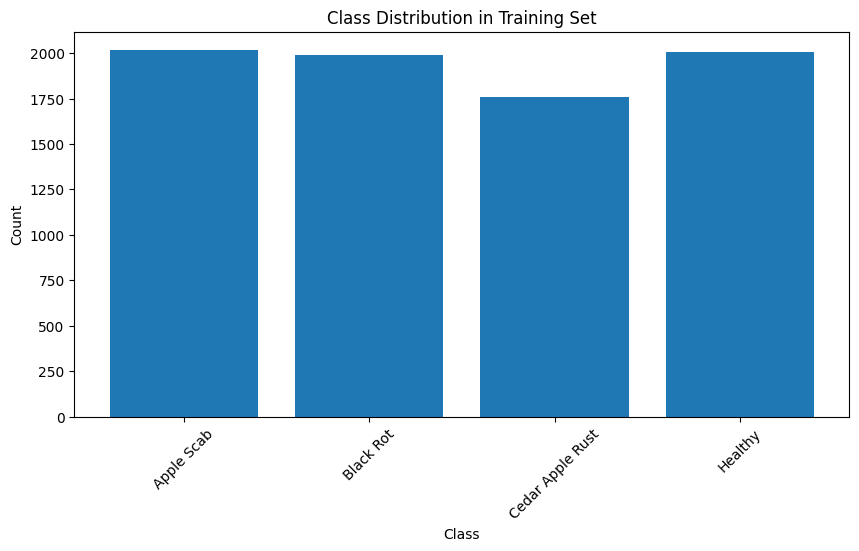

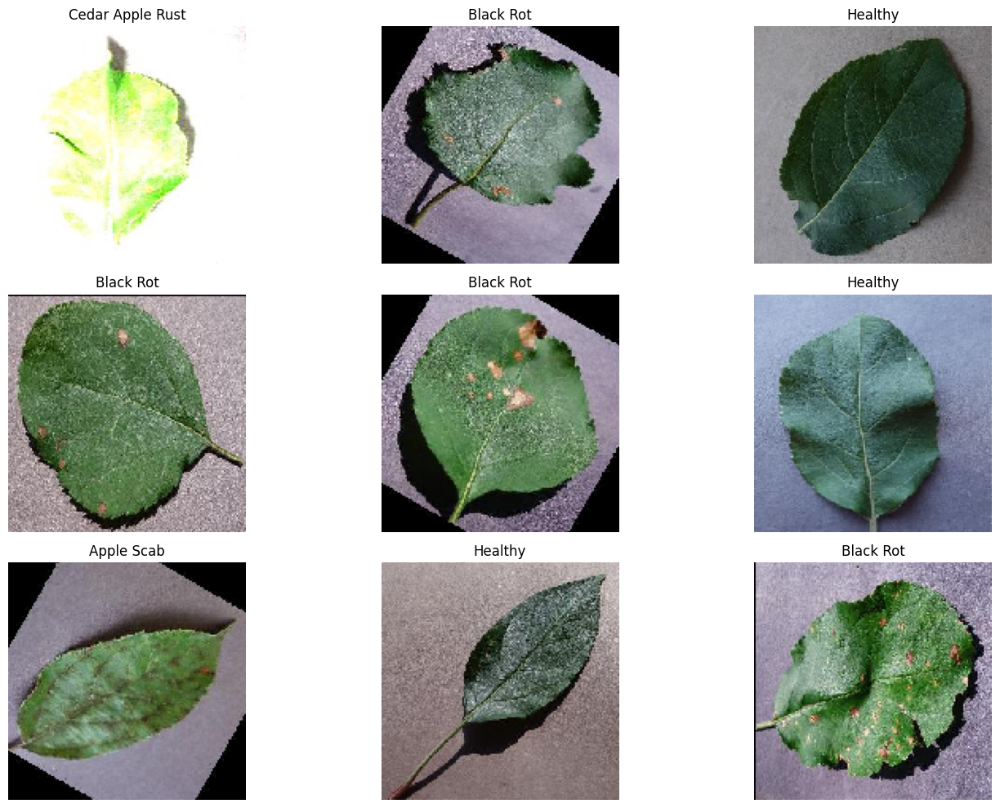

In [16]:
# Get class names and counts
class_counts = {class_name: sum(train_generator.classes == i) 
                for i, class_name in enumerate(class_names)}

# Plot class distribution
plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title('Class Distribution in Training Set')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Display sample images
plt.figure(figsize=(15, 10))
for images, labels in train_generator:
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis('off')
    break
plt.tight_layout()
plt.show()

## Training

## CNN 

In [17]:
from tensorflow.keras.layers import Conv2D, MaxPooling2D

# Function to create CNN model
def create_cnn_model():
    model = Sequential([
        Conv2D(32, (3, 3), activation='relu', input_shape=(150, 150, 3)),
        MaxPooling2D(2, 2),
        
        Conv2D(64, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        
        Conv2D(128, (3, 3), activation='relu'),
        MaxPooling2D(2, 2),
        
        Flatten(),
        Dropout(0.5),
        Dense(512, activation='relu'),
        Dense(num_classes, activation='softmax')
    ])
    return model



# Training configurations
configs = [
    {'optimizer': Adam(), 'name': 'Adam'},
    {'optimizer': SGD(learning_rate=0.01, momentum=0.9), 'name': 'SGD'},
    {'optimizer': RMSprop(learning_rate=0.001), 'name': 'RMSprop'}
]

epochs_list = [5, 10, 20]
batch_sizes = [32, 64, 128]

# Training loop
cnn = {}

In [18]:
# Training loop
cnn = {}

for config in configs:
    for epochs in epochs_list:
        for batch_size in batch_sizes:
            print(f"\nTraining CNN - {config['name']}, {epochs} epochs, batch {batch_size}")
            
            # Create fresh CNN model
            model = create_cnn_model()

            # Clone optimizer
            current_optimizer = config['optimizer'].__class__.from_config(config['optimizer'].get_config())

            model.compile(optimizer=current_optimizer, 
                         loss='categorical_crossentropy', 
                         metrics=['accuracy'])

            history = model.fit(
                train_generator,
                steps_per_epoch=train_generator.samples // batch_size,
                epochs=epochs,
                validation_data=val_generator,
                validation_steps=val_generator.samples // batch_size,
                verbose=1
            )

            key = f"CNN_{config['name']}_{epochs}ep_{batch_size}bs"
            cnn[key] = {'model': model, 'history': history.history}
            
            # Evaluate on test set
            test_loss, test_acc = model.evaluate(
                test_generator,
                steps=test_generator.samples // batch_size
            )
            print(f"Test accuracy for {key}: {test_acc:.4f}")


Training CNN - Adam, 5 epochs, batch 32
Epoch 1/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 24s 82ms/step - accuracy: 0.6361 - loss: 0.8297 - val_accuracy: 0.8646 - val_loss: 0.3875
Epoch 2/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8750 - loss: 0.3360 - val_accuracy: 0.9474 - val_loss: 0.3544
Epoch 3/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 15s 59ms/step - accuracy: 0.8883 - loss: 0.2988 - val_accuracy: 0.9572 - val_loss: 0.1223
Epoch 4/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 76us/step - accuracy: 1.0000 - loss: 0.0369 - val_accuracy: 0.8421 - val_loss: 0.3216
Epoch 5/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 16s 64ms/step - accuracy: 0.9408 - loss: 0.1667 - val_accuracy: 0.9653 - val_loss: 0.0958
6/6 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step - accuracy: 0.9615 - loss: 0.1113
Test accuracy for CNN_Adam_5ep_32bs: 0.9688

Training CNN - Adam, 5 epochs, batch 64
Epoch 1/5
121/121 ━━━━━━━━━━━━━━━━━━━━ 13s 64ms/step - accuracy: 0.4795 - loss: 1.1232 - val_accuracy: 0.7535 - val_loss: 0.6040
Epoch 2/5
121/121 ━━━━━━━━━━━━━

### CNN Performance Evaluation

### Classification Reports

Found 196 images belonging to 4 classes.

CNN_Adam_5ep_32bs


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 98ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.960     0.941     0.950        51
       Black Rot      1.000     0.980     0.990        50
Cedar Apple Rust      0.917     1.000     0.957        44
         Healthy      1.000     0.961     0.980        51

        accuracy                          0.969       196
       macro avg      0.969     0.970     0.969       196
    weighted avg      0.971     0.969     0.970       196



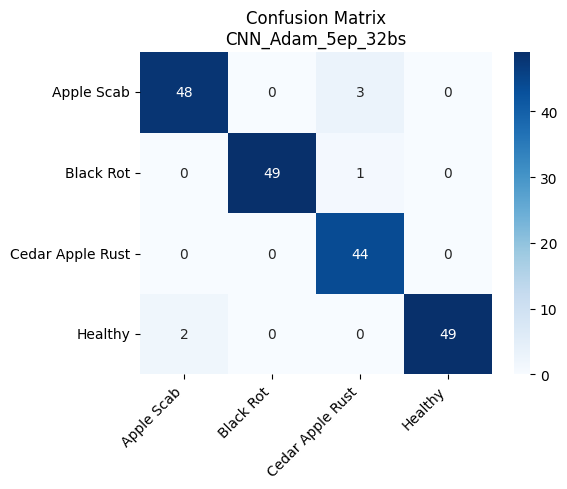


CNN_Adam_5ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.796     0.843     0.819        51
       Black Rot      0.956     0.860     0.905        50
Cedar Apple Rust      0.863     1.000     0.926        44
         Healthy      1.000     0.902     0.948        51

        accuracy                          0.898       196
       macro avg      0.904     0.901     0.900       196
    weighted avg      0.905     0.898     0.899       196



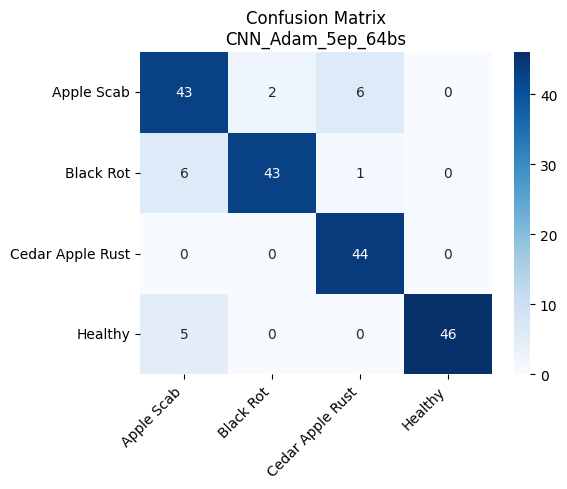


CNN_Adam_5ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.684     0.765     0.722        51
       Black Rot      1.000     0.560     0.718        50
Cedar Apple Rust      0.854     0.932     0.891        44
         Healthy      0.778     0.961     0.860        51

        accuracy                          0.801       196
       macro avg      0.829     0.804     0.798       196
    weighted avg      0.827     0.801     0.795       196



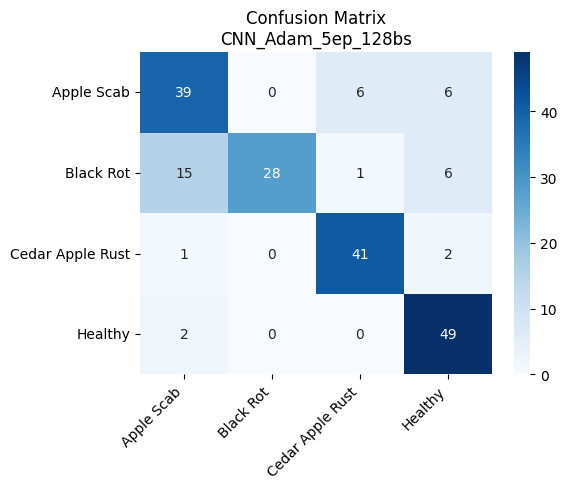


CNN_Adam_10ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 81ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.941     0.941     0.941        51
       Black Rot      1.000     0.980     0.990        50
Cedar Apple Rust      0.976     0.909     0.941        44
         Healthy      0.891     0.961     0.925        51

        accuracy                          0.949       196
       macro avg      0.952     0.948     0.949       196
    weighted avg      0.951     0.949     0.949       196



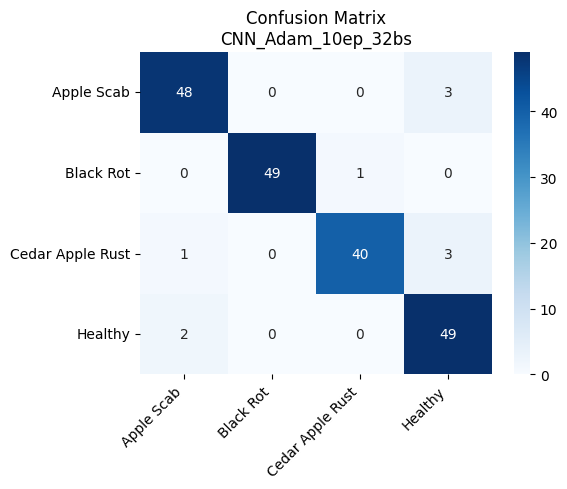


CNN_Adam_10ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.862     0.980     0.917        51
       Black Rot      1.000     0.940     0.969        50
Cedar Apple Rust      0.957     1.000     0.978        44
         Healthy      1.000     0.882     0.938        51

        accuracy                          0.949       196
       macro avg      0.955     0.951     0.950       196
    weighted avg      0.954     0.949     0.949       196



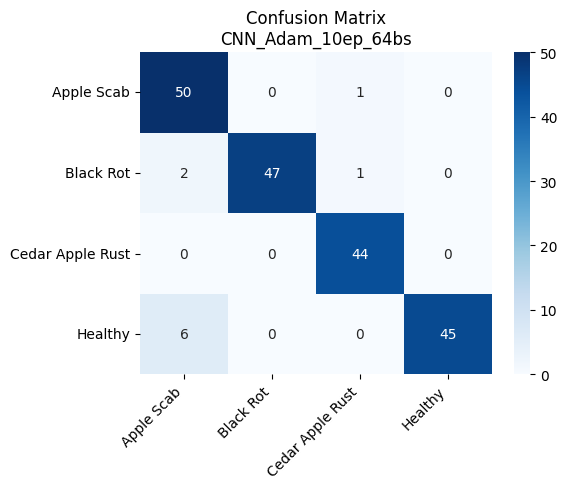


CNN_Adam_10ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.923     0.706     0.800        51
       Black Rot      0.936     0.880     0.907        50
Cedar Apple Rust      0.846     1.000     0.917        44
         Healthy      0.879     1.000     0.936        51

        accuracy                          0.893       196
       macro avg      0.896     0.896     0.890       196
    weighted avg      0.898     0.893     0.889       196



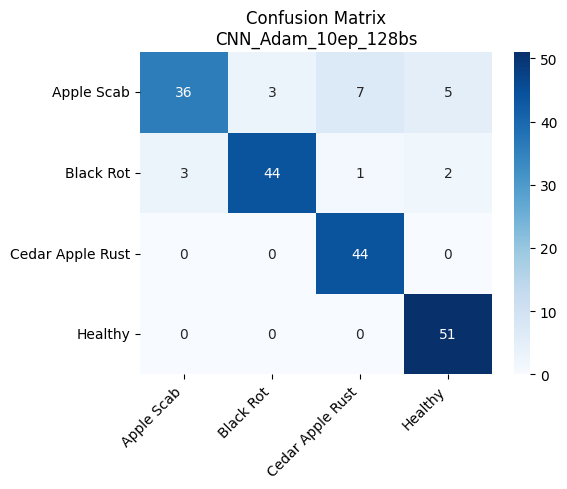


CNN_Adam_20ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.980     0.961     0.970        51
       Black Rot      0.980     0.980     0.980        50
Cedar Apple Rust      1.000     1.000     1.000        44
         Healthy      0.962     0.980     0.971        51

        accuracy                          0.980       196
       macro avg      0.980     0.980     0.980       196
    weighted avg      0.980     0.980     0.980       196



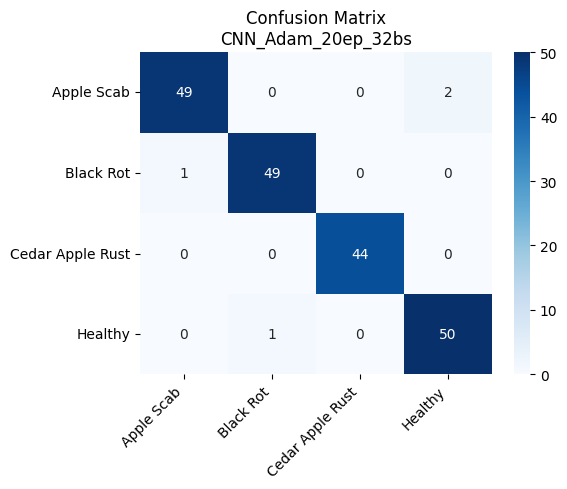


CNN_Adam_20ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.933     0.824     0.875        51
       Black Rot      1.000     0.980     0.990        50
Cedar Apple Rust      0.830     1.000     0.907        44
         Healthy      0.980     0.941     0.960        51

        accuracy                          0.934       196
       macro avg      0.936     0.936     0.933       196
    weighted avg      0.939     0.934     0.934       196



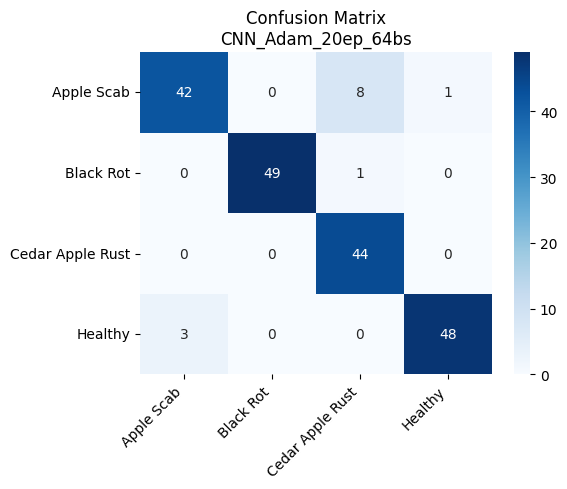


CNN_Adam_20ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.959     0.922     0.940        51
       Black Rot      1.000     0.980     0.990        50
Cedar Apple Rust      0.917     1.000     0.957        44
         Healthy      1.000     0.980     0.990        51

        accuracy                          0.969       196
       macro avg      0.969     0.970     0.969       196
    weighted avg      0.971     0.969     0.969       196



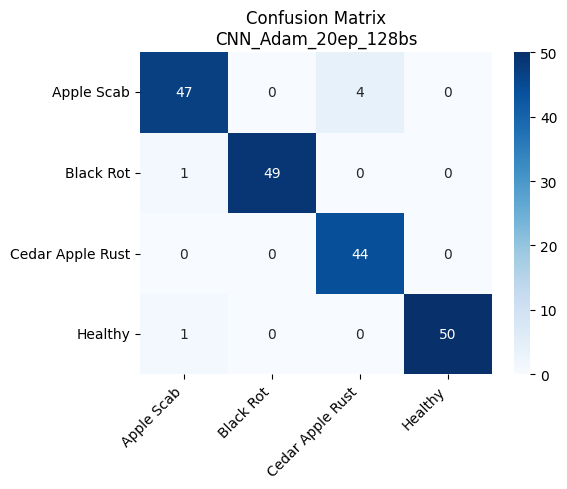


CNN_SGD_5ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.978     0.882     0.928        51
       Black Rot      1.000     0.980     0.990        50
Cedar Apple Rust      0.978     1.000     0.989        44
         Healthy      0.893     0.980     0.935        51

        accuracy                          0.959       196
       macro avg      0.962     0.961     0.960       196
    weighted avg      0.961     0.959     0.959       196



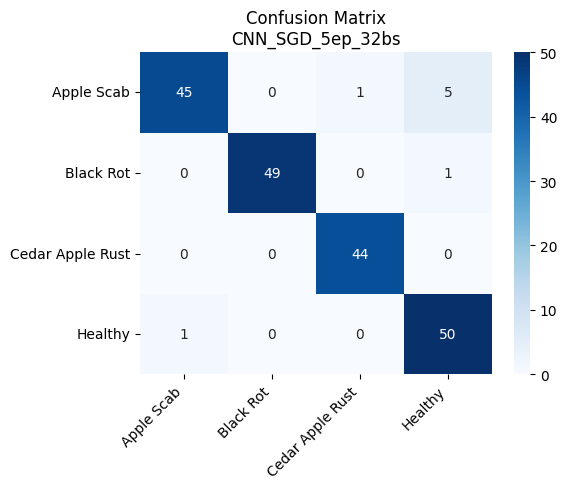


CNN_SGD_5ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.800     0.863     0.830        51
       Black Rot      0.907     0.980     0.942        50
Cedar Apple Rust      0.846     1.000     0.917        44
         Healthy      1.000     0.686     0.814        51

        accuracy                          0.878       196
       macro avg      0.888     0.882     0.876       196
    weighted avg      0.890     0.878     0.874       196



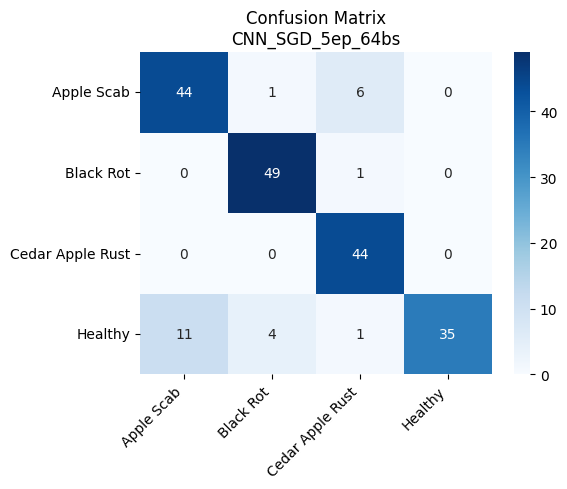


CNN_SGD_5ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.857     0.353     0.500        51
       Black Rot      0.467     0.840     0.600        50
Cedar Apple Rust      0.737     0.636     0.683        44
         Healthy      0.766     0.706     0.735        51

        accuracy                          0.633       196
       macro avg      0.707     0.634     0.629       196
    weighted avg      0.707     0.633     0.628       196



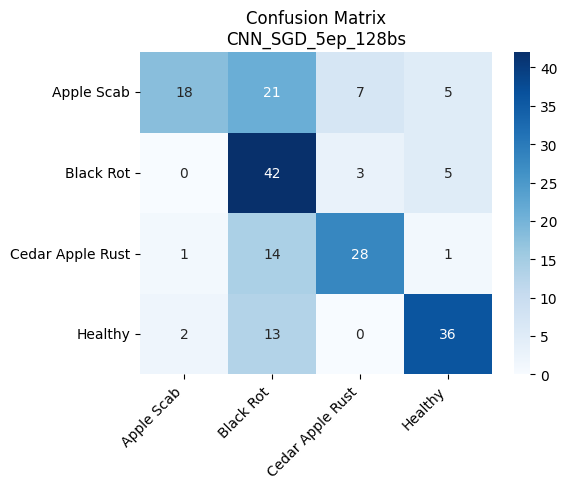


CNN_SGD_10ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.940     0.922     0.931        51
       Black Rot      1.000     0.980     0.990        50
Cedar Apple Rust      1.000     0.932     0.965        44
         Healthy      0.911     1.000     0.953        51

        accuracy                          0.959       196
       macro avg      0.963     0.958     0.960       196
    weighted avg      0.961     0.959     0.959       196



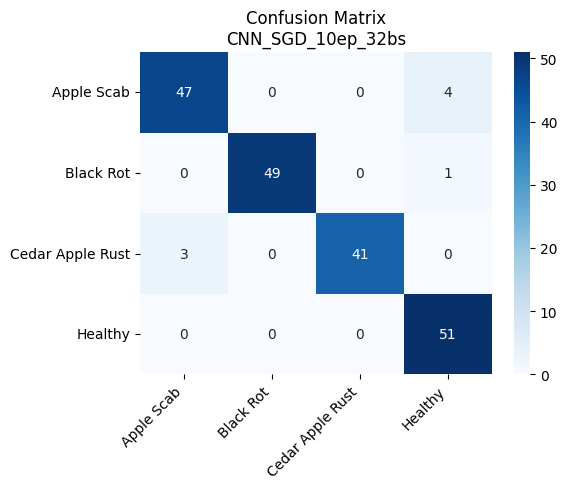


CNN_SGD_10ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 3s 97ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.936     0.863     0.898        51
       Black Rot      0.925     0.980     0.951        50
Cedar Apple Rust      0.896     0.977     0.935        44
         Healthy      0.979     0.922     0.949        51

        accuracy                          0.934       196
       macro avg      0.934     0.935     0.933       196
    weighted avg      0.935     0.934     0.933       196



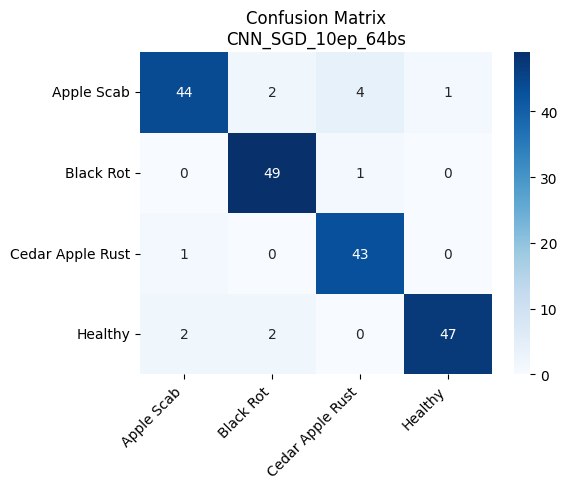


CNN_SGD_10ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.756     0.667     0.708        51
       Black Rot      0.818     0.900     0.857        50
Cedar Apple Rust      0.796     0.977     0.878        44
         Healthy      0.976     0.804     0.882        51

        accuracy                          0.832       196
       macro avg      0.837     0.837     0.831       196
    weighted avg      0.838     0.832     0.829       196



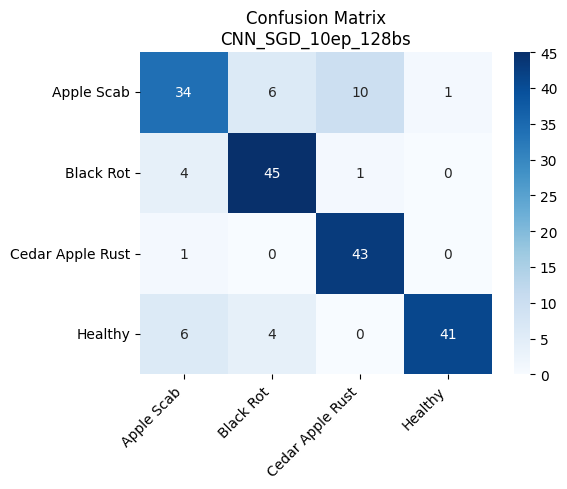


CNN_SGD_20ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.980     0.990        51
       Black Rot      1.000     1.000     1.000        50
Cedar Apple Rust      1.000     1.000     1.000        44
         Healthy      0.981     1.000     0.990        51

        accuracy                          0.995       196
       macro avg      0.995     0.995     0.995       196
    weighted avg      0.995     0.995     0.995       196



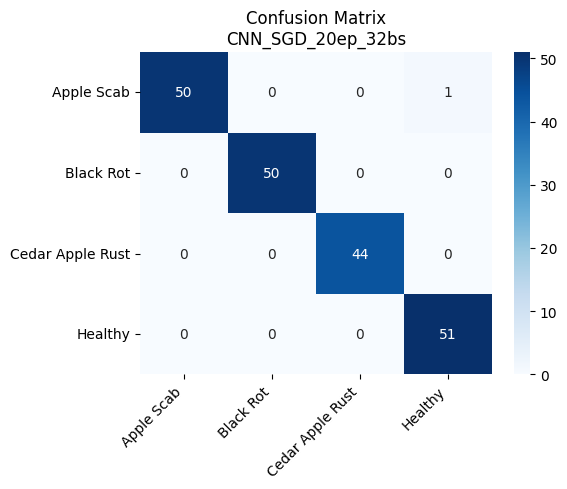


CNN_SGD_20ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.980     0.941     0.960        51
       Black Rot      0.961     0.980     0.970        50
Cedar Apple Rust      0.957     1.000     0.978        44
         Healthy      0.980     0.961     0.970        51

        accuracy                          0.969       196
       macro avg      0.969     0.970     0.970       196
    weighted avg      0.970     0.969     0.969       196



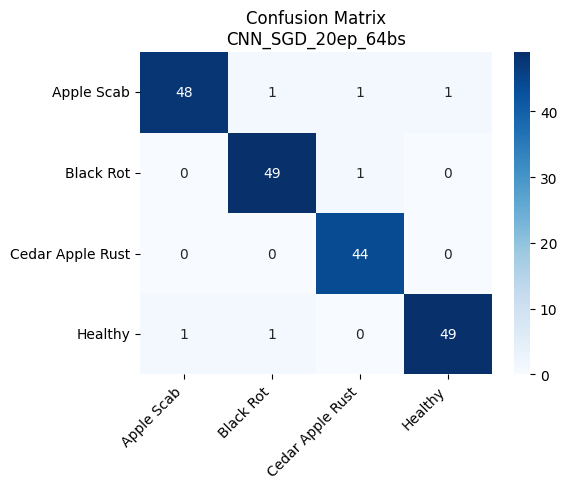


CNN_SGD_20ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 96ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.863     0.863     0.863        51
       Black Rot      0.978     0.880     0.926        50
Cedar Apple Rust      0.905     0.864     0.884        44
         Healthy      0.810     0.922     0.862        51

        accuracy                          0.883       196
       macro avg      0.889     0.882     0.884       196
    weighted avg      0.888     0.883     0.884       196



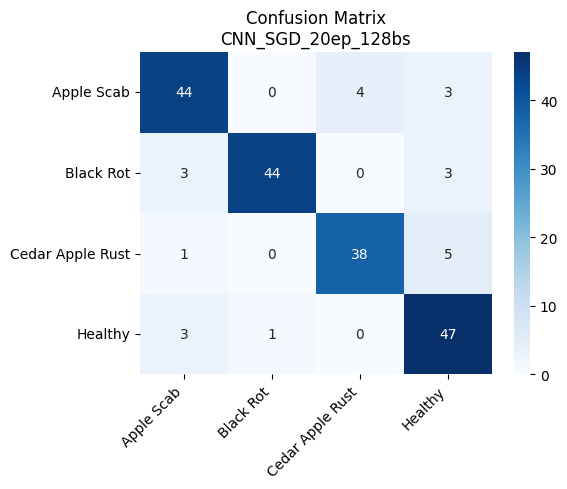


CNN_RMSprop_5ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.939     0.902     0.920        51
       Black Rot      0.942     0.980     0.961        50
Cedar Apple Rust      0.955     0.955     0.955        44
         Healthy      0.941     0.941     0.941        51

        accuracy                          0.944       196
       macro avg      0.944     0.944     0.944       196
    weighted avg      0.944     0.944     0.944       196



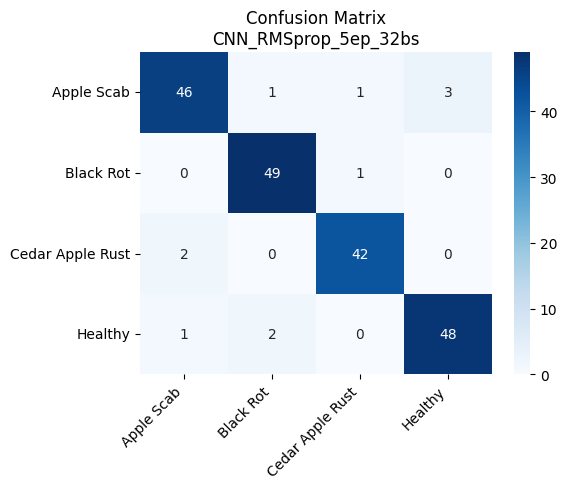


CNN_RMSprop_5ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.933     0.824     0.875        51
       Black Rot      0.889     0.960     0.923        50
Cedar Apple Rust      0.898     1.000     0.946        44
         Healthy      0.979     0.922     0.949        51

        accuracy                          0.923       196
       macro avg      0.925     0.926     0.923       196
    weighted avg      0.926     0.923     0.923       196



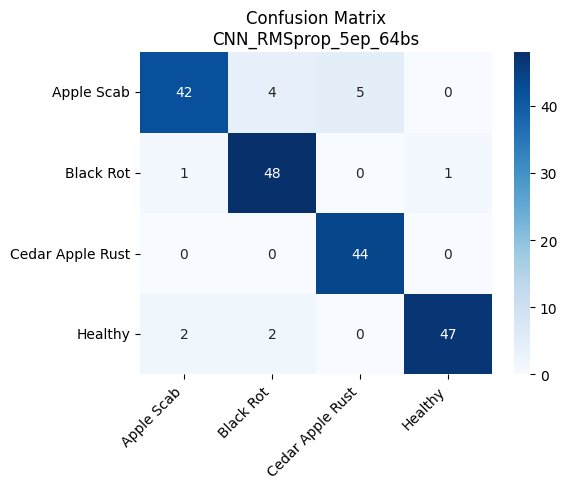


CNN_RMSprop_5ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.672     0.804     0.732        51
       Black Rot      0.917     0.660     0.767        50
Cedar Apple Rust      0.841     0.841     0.841        44
         Healthy      0.855     0.922     0.887        51

        accuracy                          0.806       196
       macro avg      0.821     0.807     0.807       196
    weighted avg      0.820     0.806     0.806       196



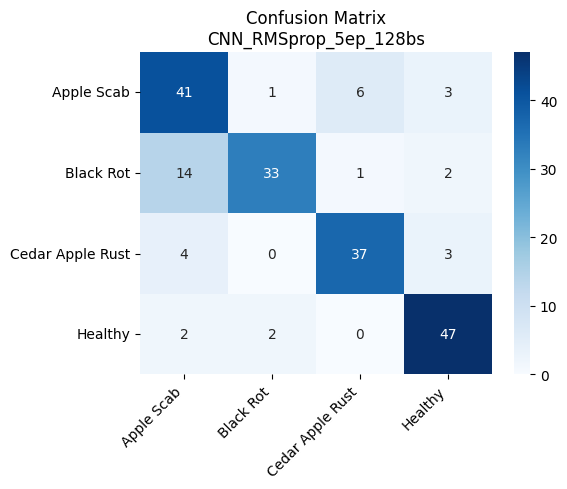


CNN_RMSprop_10ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.902     0.902     0.902        51
       Black Rot      1.000     0.860     0.925        50
Cedar Apple Rust      0.977     0.977     0.977        44
         Healthy      0.845     0.961     0.899        51

        accuracy                          0.923       196
       macro avg      0.931     0.925     0.926       196
    weighted avg      0.929     0.923     0.924       196



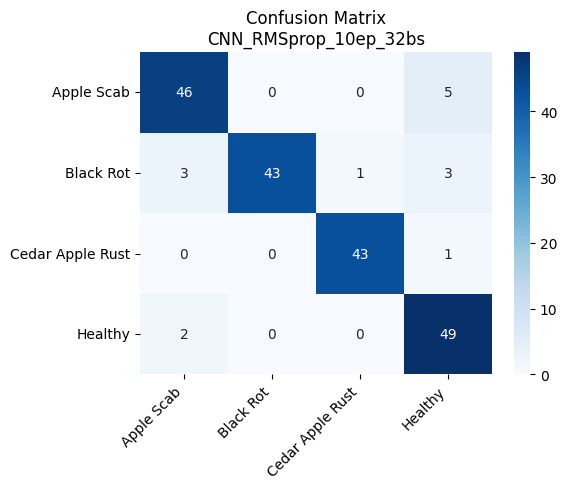


CNN_RMSprop_10ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.765     0.867        51
       Black Rot      0.907     0.980     0.942        50
Cedar Apple Rust      0.863     1.000     0.926        44
         Healthy      0.942     0.961     0.951        51

        accuracy                          0.923       196
       macro avg      0.928     0.926     0.922       196
    weighted avg      0.931     0.923     0.921       196



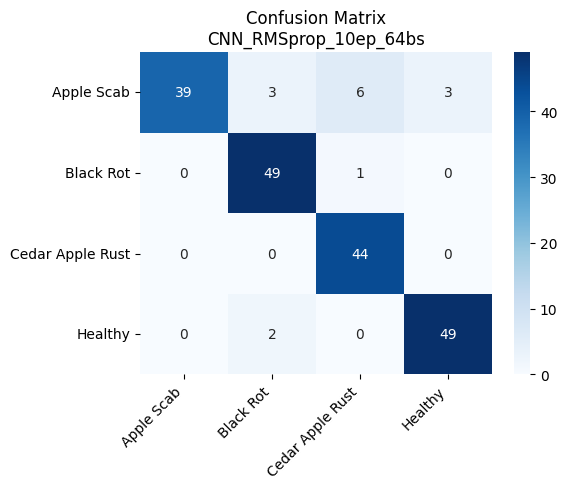


CNN_RMSprop_10ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.905     0.745     0.817        51
       Black Rot      0.957     0.880     0.917        50
Cedar Apple Rust      0.830     1.000     0.907        44
         Healthy      0.873     0.941     0.906        51

        accuracy                          0.888       196
       macro avg      0.891     0.892     0.887       196
    weighted avg      0.893     0.888     0.886       196



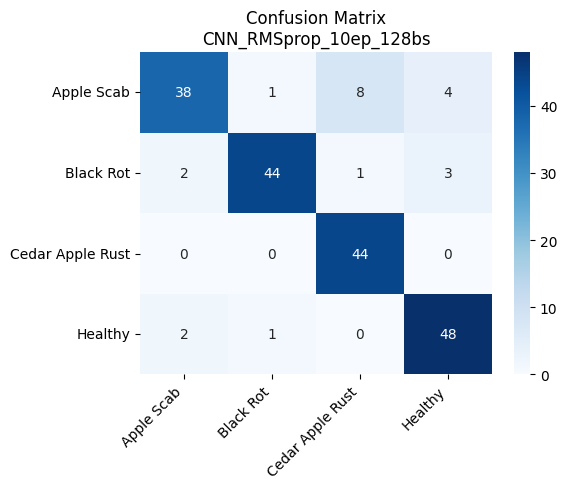


CNN_RMSprop_20ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 90ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.980     0.961     0.970        51
       Black Rot      0.962     1.000     0.980        50
Cedar Apple Rust      1.000     1.000     1.000        44
         Healthy      1.000     0.980     0.990        51

        accuracy                          0.985       196
       macro avg      0.985     0.985     0.985       196
    weighted avg      0.985     0.985     0.985       196



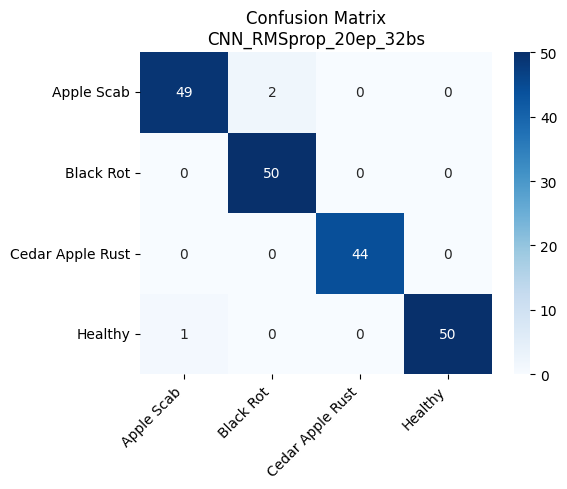


CNN_RMSprop_20ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 94ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.978     0.863     0.917        51
       Black Rot      0.980     1.000     0.990        50
Cedar Apple Rust      0.936     1.000     0.967        44
         Healthy      0.943     0.980     0.962        51

        accuracy                          0.959       196
       macro avg      0.959     0.961     0.959       196
    weighted avg      0.960     0.959     0.958       196



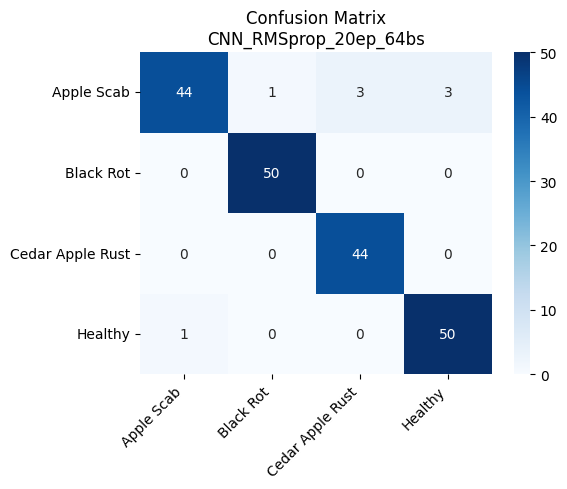


CNN_RMSprop_20ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.926     0.980     0.952        51
       Black Rot      1.000     0.920     0.958        50
Cedar Apple Rust      0.977     0.955     0.966        44
         Healthy      0.943     0.980     0.962        51

        accuracy                          0.959       196
       macro avg      0.962     0.959     0.959       196
    weighted avg      0.961     0.959     0.959       196



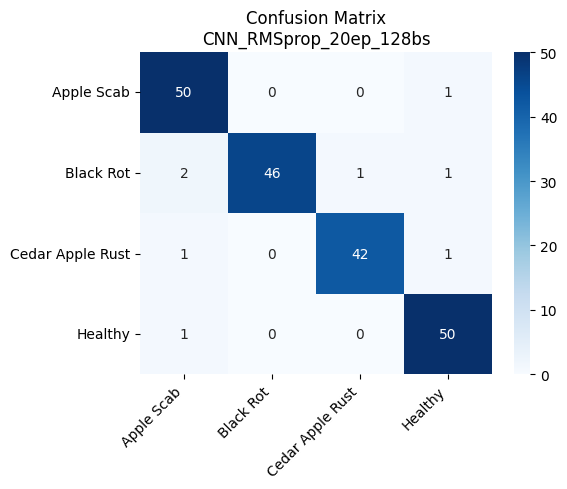

In [23]:
def evaluate_cnn_models(cnn):

    from sklearn.metrics import classification_report, confusion_matrix
    import matplotlib.pyplot as plt
    import seaborn as sns
    import numpy as np
    
    # Create evaluation generator
    eval_datagen = ImageDataGenerator(rescale=1./255)
    eval_gen = eval_datagen.flow_from_directory(
        "/kaggle/input/apple-dataset/Apple/Test",
        target_size=(150, 150),
        batch_size=32,
        class_mode='categorical',
        shuffle=False
    )
    class_names = list(eval_gen.class_indices.keys())
    
    # Evaluate each model
    for model_name, model_data in cnn.items():
        print(f"\n\033[1m{model_name}\033[0m")
        print("=" * 60)
        
        # Get predictions
        eval_gen.reset()
        y_true = eval_gen.classes
        y_pred = np.argmax(model_data['model'].predict(eval_gen), axis=1)
        
        # Classification report
        print("\nClassification Report:")
        print(classification_report(y_true, y_pred, 
                                  target_names=class_names, 
                                  digits=3))
        
        # Confusion matrix
        plt.figure(figsize=(6,5))
        sns.heatmap(confusion_matrix(y_true, y_pred),
                    annot=True, fmt='d', cmap='Blues',
                    xticklabels=class_names,
                    yticklabels=class_names)
        plt.title(f'Confusion Matrix\n{model_name}')
        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)
        plt.tight_layout()
        plt.show()


evaluate_cnn_models(cnn)


Accuracy Curves


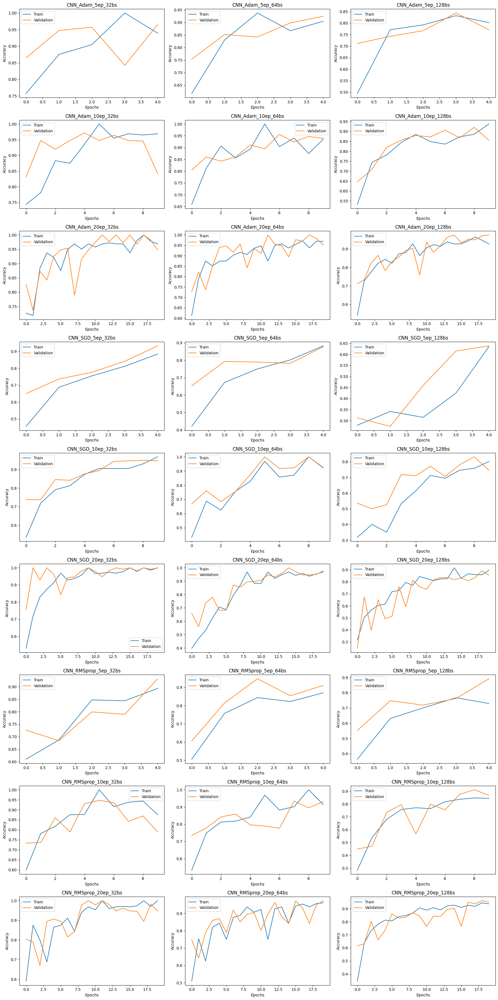


Loss Curves


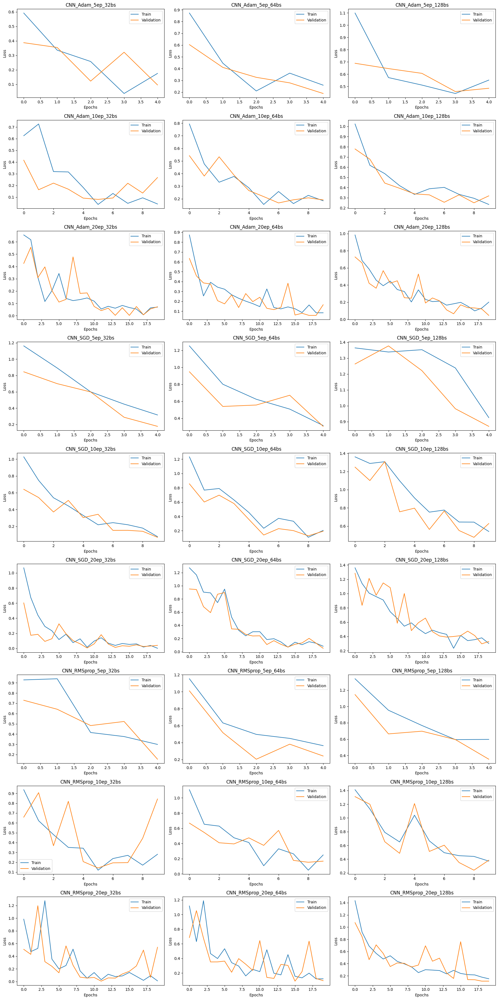

In [25]:
import math
import matplotlib.pyplot as plt

def plot_metrics(results, metric='accuracy'):
    num_plots = len(results)
    cols = 3
    rows = math.ceil(num_plots / cols)

    plt.figure(figsize=(cols * 6, rows * 4))
    for i, (key, value) in enumerate(results.items()):
        history = value['history']
        plt.subplot(rows, cols, i + 1)
        plt.plot(history[metric], label='Train')
        plt.plot(history['val_' + metric], label='Validation')
        plt.title(key)
        plt.xlabel('Epochs')
        plt.ylabel(metric.capitalize())
        plt.legend()
    plt.tight_layout()
    plt.show()

print("\nAccuracy Curves")
plot_metrics(cnn, metric='accuracy')

print("\nLoss Curves")
plot_metrics(cnn, metric='loss')

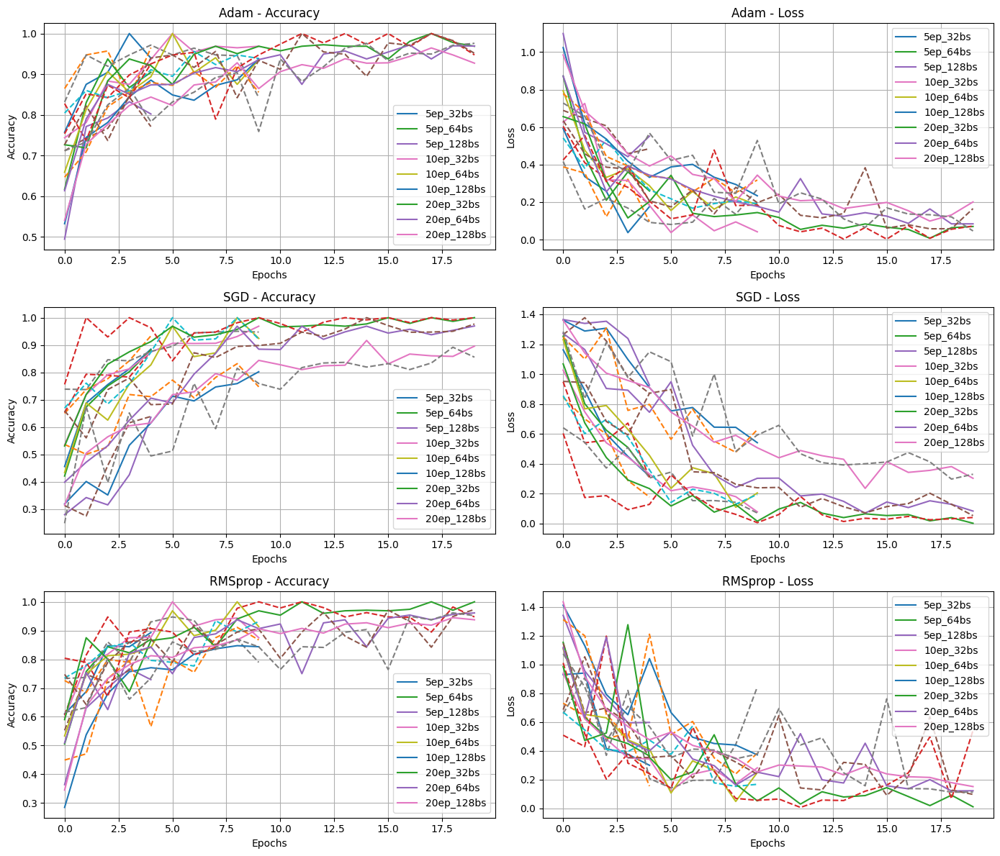

In [26]:
fig, axs = plt.subplots(3, 2, figsize=(14, 12))
optimizer_names = ['Adam', 'SGD', 'RMSprop']

for i, opt_name in enumerate(optimizer_names):
    ax_acc = axs[i][0]
    ax_loss = axs[i][1]
    ax_acc.set_title(f'{opt_name} - Accuracy')
    ax_loss.set_title(f'{opt_name} - Loss')

    for key in cnn:
        if f"CNN_{opt_name}" in key:
            history = cnn[key]['history']
            label = key.split('_', 2)[-1]
            ax_acc.plot(history['accuracy'], label=label)
            ax_acc.plot(history['val_accuracy'], linestyle='--')
            ax_loss.plot(history['loss'], label=label)
            ax_loss.plot(history['val_loss'], linestyle='--')

    ax_acc.set_ylabel('Accuracy')
    ax_loss.set_ylabel('Loss')
    ax_acc.set_xlabel('Epochs')
    ax_loss.set_xlabel('Epochs')
    ax_acc.grid(True)
    ax_loss.grid(True)
    ax_acc.legend()
    ax_loss.legend()

plt.tight_layout()
plt.show()

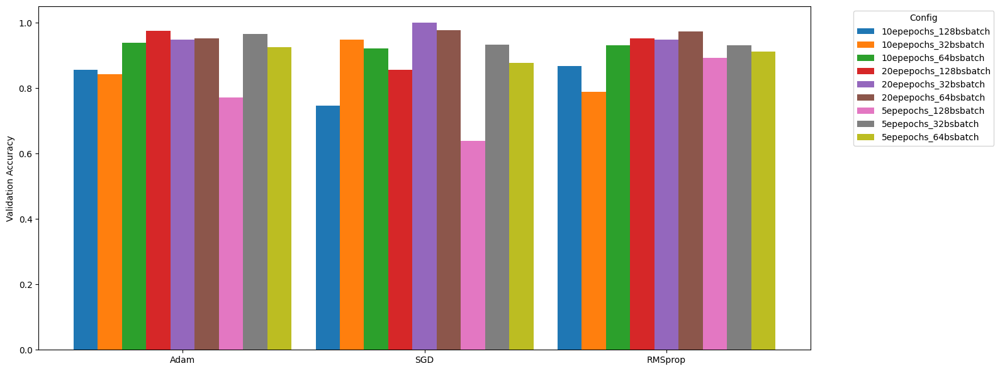

In [27]:
import numpy as np

bar_data = {}
for key in cnn:
    parts = key.split('_')
    opt_name = parts[1]
    config_label = f"{parts[2]}epochs_{parts[3]}batch"
    val_acc = cnn[key]['history']['val_accuracy'][-1]

    if opt_name not in bar_data:
        bar_data[opt_name] = {}
    bar_data[opt_name][config_label] = val_acc

optimizers = list(bar_data.keys())
configs = sorted(list({cfg for opt in bar_data.values() for cfg in opt.keys()}))

plt.figure(figsize=(16, 6))
x = np.arange(len(optimizers))
width = 0.10

for i, cfg in enumerate(configs):
    plt.bar(x + i * width, [bar_data[opt].get(cfg, 0) for opt in optimizers],
            width=width, label=cfg)

plt.ylabel('Validation Accuracy')
plt.xticks(x + width * (len(configs)-1)/2, optimizers)
plt.legend(title='Config', bbox_to_anchor=(1.05, 1))
plt.tight_layout()
plt.show()

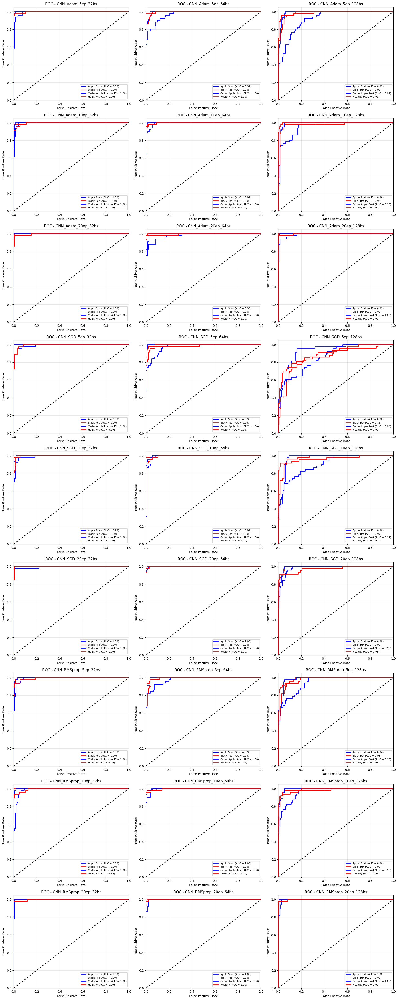

In [32]:
from math import ceil
from itertools import cycle

num_models = len(cnn)
cols = 3
rows = ceil(num_models / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
axes = axes.ravel()

# Generate ROC curve for each model in separate subplot
for i, (model_name, model_data) in enumerate(cnn.items()):
    model = model_data['model']
    
    # Get true labels and predictions
    test_generator.reset()
    y_true = []
    y_pred = []
    
    for _ in range(test_generator.samples // test_generator.batch_size):
        x, y = next(test_generator)
        y_true.extend(y)
        y_pred.extend(model.predict(x, verbose=0))
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Compute ROC curve and ROC area for each class
    ax = axes[i]
    colors = cycle(['blue', 'red'])
    
    for j, color in zip(range(y_true.shape[1]), colors):
        fpr, tpr, _ = roc_curve(y_true[:, j], y_pred[:, j])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, lw=2,
                label=f'{class_names[j]} (AUC = {roc_auc:.2f})')
    
    ax.plot([0, 1], [0, 1], 'k--', lw=2)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f'ROC - {model_name}')
    ax.legend(loc="lower right", fontsize=8)
    ax.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


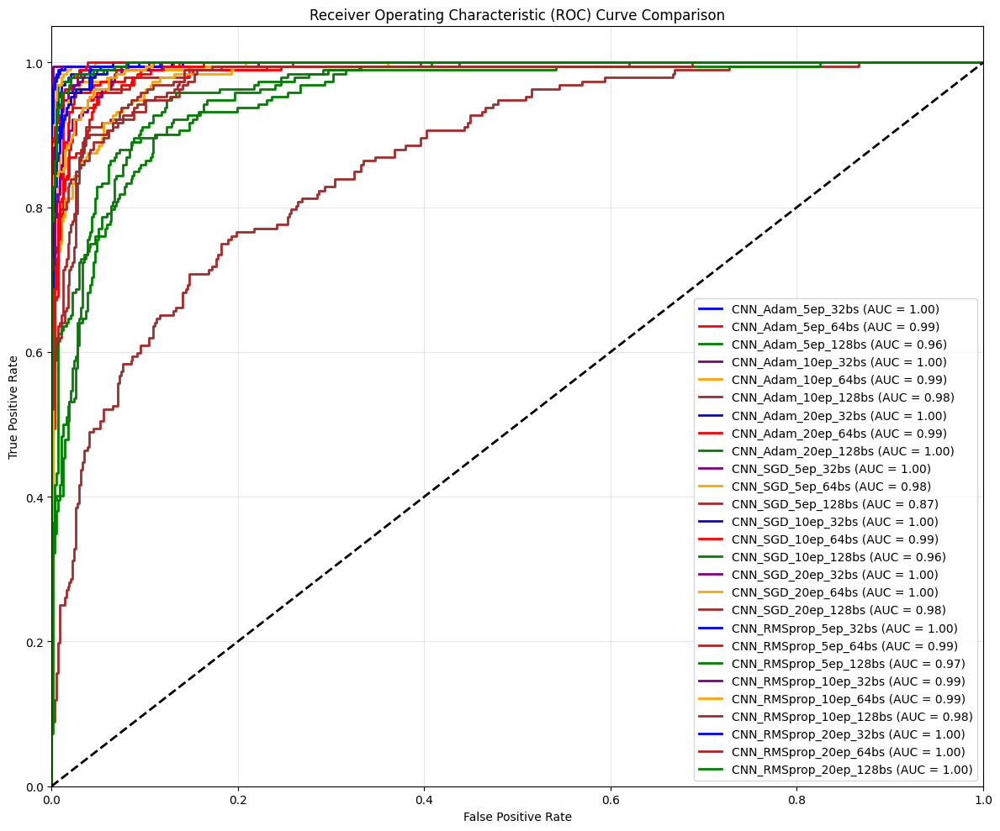

In [30]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, auc
from itertools import cycle

# Set up the plot
plt.figure(figsize=(12, 10))
colors = cycle(['blue', 'red', 'green', 'purple', 'orange', 'brown'])
lw = 2

# Generate ROC curve for each model
for i, (model_name, model_data) in enumerate(cnn.items()):
    model = model_data['model']
    
    # Get true labels and predictions
    test_generator.reset()
    y_true = []
    y_pred = []
    
    for _ in range(test_generator.samples // test_generator.batch_size):
        x, y = next(test_generator)
        y_true.extend(y)
        y_pred.extend(model.predict(x, verbose=0))
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Compute ROC curve and ROC area for each class
    fpr = dict()
    tpr = dict()
    roc_auc = dict()
    
    for j in range(num_classes):
        fpr[j], tpr[j], _ = roc_curve(y_true[:, j], y_pred[:, j])
        roc_auc[j] = auc(fpr[j], tpr[j])
    
    # Compute micro-average ROC curve and ROC area
    fpr["micro"], tpr["micro"], _ = roc_curve(y_true.ravel(), y_pred.ravel())
    roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])
    
    # Plot ROC curves
    color = next(colors)
    plt.plot(fpr["micro"], tpr["micro"],
             label=f'{model_name} (AUC = {roc_auc["micro"]:.2f})',
             color=color, linestyle='-', linewidth=lw)

# Format the plot
plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve Comparison')
plt.legend(loc="lower right", bbox_to_anchor=(1.0, 0.0), fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━

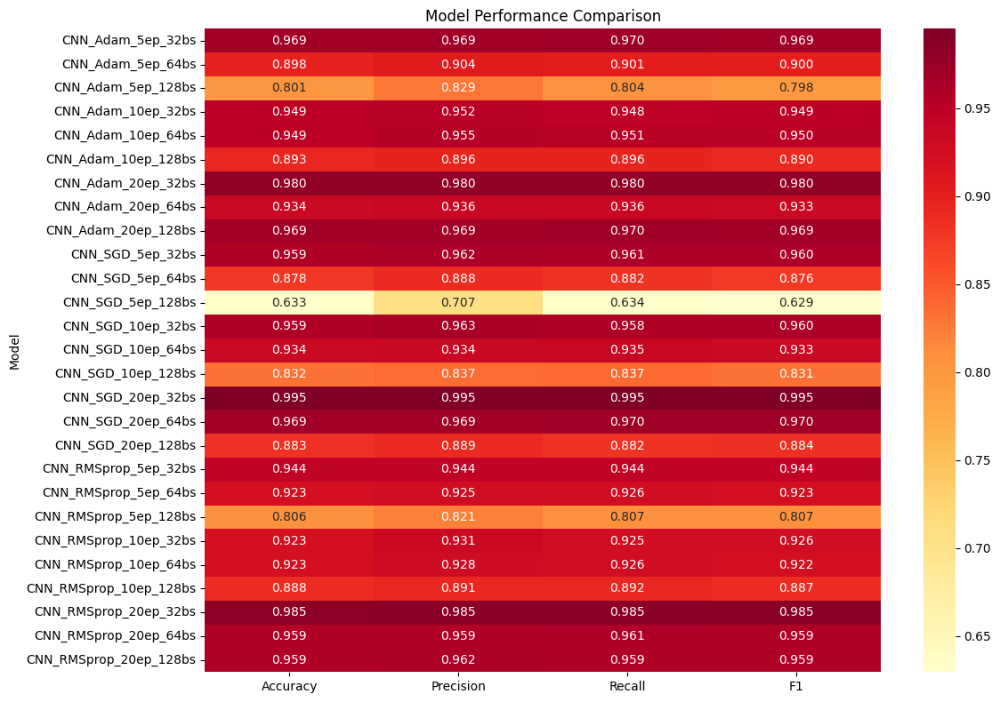


Saved best model: CNN_SGD_20ep_32bs with accuracy 0.9949


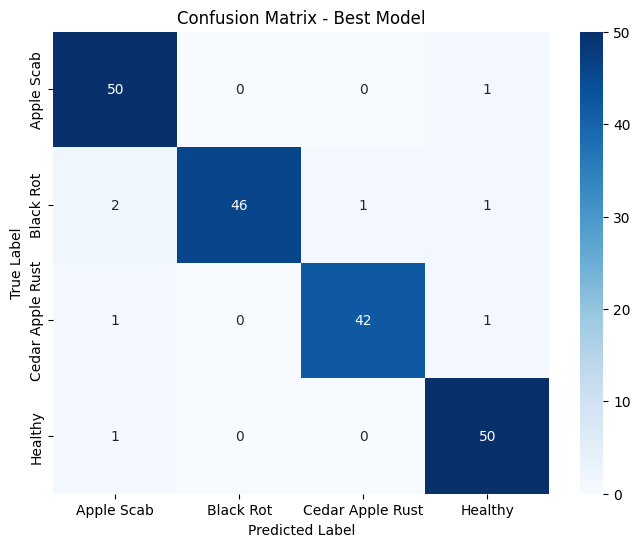

In [59]:
from sklearn.metrics import classification_report, confusion_matrix
import pandas as pd
import seaborn as sns

metrics_data = []
best_model = None
best_score = 0

test_generator.reset()
test_images, test_labels = [], []
for i in range(len(test_generator)):
    img_batch, label_batch = test_generator[i]
    test_images.append(img_batch)
    test_labels.append(label_batch)
    
test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

for key, model_data in cnn.items():
    model = model_data['model']
    y_pred = model.predict(test_images)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(test_labels, axis=1)
    
    acc = np.mean(y_pred_classes == y_true)
    report = classification_report(y_true, y_pred_classes, 
                                 target_names=class_names,
                                 output_dict=True)
    
    metrics_data.append({
        'Model': key,
        'Accuracy': acc,
        'Precision': report['macro avg']['precision'],
        'Recall': report['macro avg']['recall'],
        'F1': report['macro avg']['f1-score']
    })
    
    if acc > best_score:
        best_score = acc
        best_model = model
        best_model_name = key

metrics_df = pd.DataFrame(metrics_data).set_index('Model')
print("\nPerformance Metrics:")
print(metrics_df)

plt.figure(figsize=(12, 8))
sns.heatmap(metrics_df, annot=True, fmt=".3f", cmap="YlOrRd")
plt.title("Model Performance Comparison")
plt.tight_layout()
plt.show()

if best_model:
    best_model.save('best_apple_model.h5')
    print(f"\nSaved best model: {best_model_name} with accuracy {best_score:.4f}")
    
    # Confusion matrix for best model
    cm = confusion_matrix(y_true, y_pred_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', 
                xticklabels=class_names, 
                yticklabels=class_names)
    plt.title('Confusion Matrix - Best Model')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


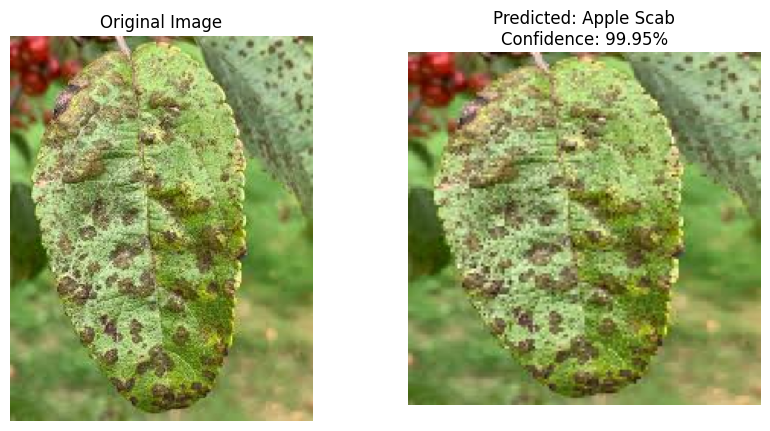

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


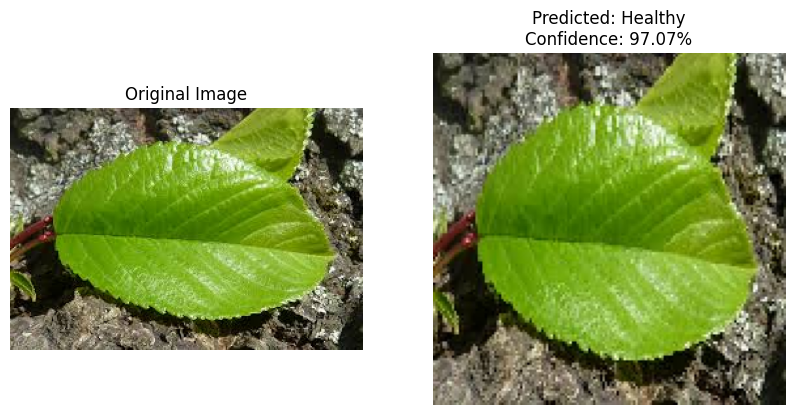

In [62]:
from tensorflow.keras.preprocessing import image

def predict_and_display(image_path):
    img = image.load_img(image_path, target_size=(150, 150))
    img_array = image.img_to_array(img)/255.0
    img_array = np.expand_dims(img_array, axis=0)
    
    model = best_model if best_model else trained_models[list(trained_models.keys())[0]]['model']
    pred = model.predict(img_array)
    class_idx = np.argmax(pred[0])
    confidence = np.max(pred[0])
    
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image.load_img(image_path))
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[class_idx]}\nConfidence: {confidence:.2%}")
    plt.axis('off')
    
    plt.show()
    return class_names[class_idx], confidence

predicted_class, confidence = predict_and_display("/kaggle/input/test-scab-1/ass3-test-scab.jpeg")
predicted_class, confidence = predict_and_display("/kaggle/input/apple-healthy/ass-3-apple-healthy.jpeg")

## Augmented Dataset

In [40]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# Parameters
img_size = (150, 150)
batch_size = 32

# Augmented ImageDataGenerator
augmented_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=25,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)

# Validation/Test sets should not be augmented
plain_datagen = ImageDataGenerator(rescale=1./255)

# Augmented training generator
train_generator_aug = augmented_datagen.flow_from_directory(
    "/kaggle/input/apple-dataset/Apple/Train",
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

# Plain val/test generators
val_generator = plain_datagen.flow_from_directory(
    "/kaggle/input/apple-dataset/Apple/Val",
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=True
)

test_generator = plain_datagen.flow_from_directory(
    "/kaggle/input/apple-dataset/Apple/Test",
    target_size=img_size,
    batch_size=batch_size,
    class_mode='categorical',
    shuffle=False
)

class_names = list(train_generator_aug.class_indices.keys())
num_classes = len(class_names)

print(f"Classes: {class_names}")


Found 7771 images belonging to 4 classes.
Found 1747 images belonging to 4 classes.
Found 196 images belonging to 4 classes.
Classes: ['Apple Scab', 'Black Rot', 'Cedar Apple Rust', 'Healthy']


### EDA

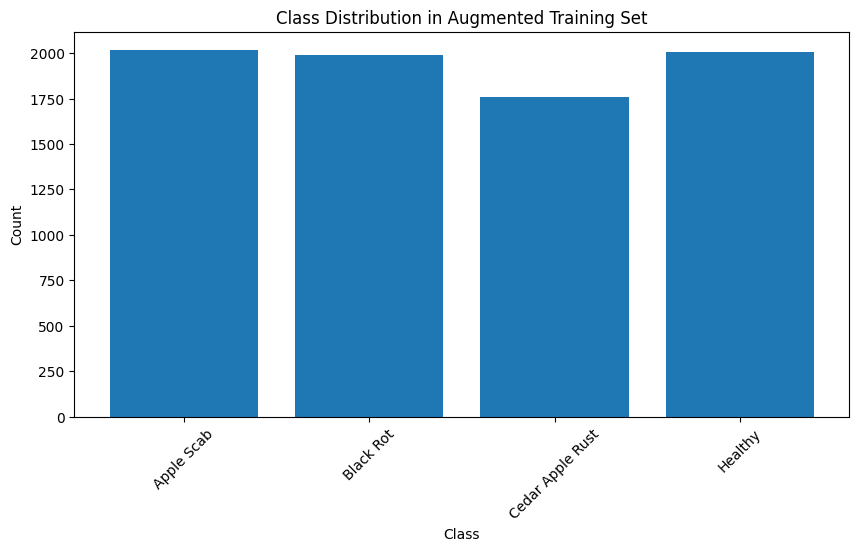

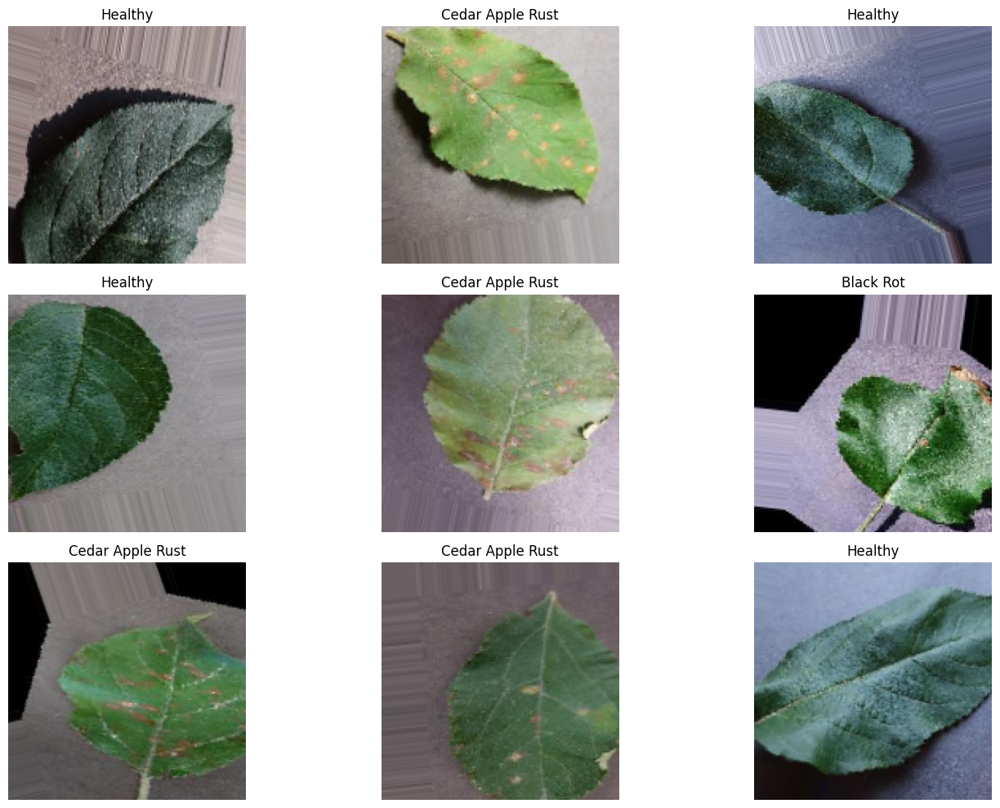

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# Class distribution
class_counts = {class_name: sum(train_generator_aug.classes == i) 
                for i, class_name in enumerate(class_names)}

# Plot class distribution
plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values())
plt.title('Class Distribution in Augmented Training Set')
plt.xlabel('Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

# Sample images from augmented generator
plt.figure(figsize=(15, 10))
for images, labels in train_generator_aug:
    for i in range(9):
        plt.subplot(3, 3, i + 1)
        plt.imshow(images[i])
        plt.title(class_names[np.argmax(labels[i])])
        plt.axis('off')
    break
plt.tight_layout()
plt.show()


In [42]:
# Function to create CNN model (already defined)

# Optimizer & training setup (already defined)
from tensorflow.keras.optimizers import Adam, SGD, RMSprop

configs = [
    {'optimizer': Adam(), 'name': 'Adam'},
    {'optimizer': SGD(learning_rate=0.01, momentum=0.9), 'name': 'SGD'},
    {'optimizer': RMSprop(learning_rate=0.001), 'name': 'RMSprop'}
]

epochs_list = [5, 10, 20]
batch_sizes = [32, 64, 128]

# Training loop
cnn_augmented = {}

for config in configs:
    for epochs in epochs_list:
        for batch_size in batch_sizes:
            print(f"\nTraining CNN (Augmented) - {config['name']}, {epochs} epochs, batch {batch_size}")
            
            model = create_cnn_model()

            current_optimizer = config['optimizer'].__class__.from_config(config['optimizer'].get_config())

            model.compile(optimizer=current_optimizer, 
                         loss='categorical_crossentropy', 
                         metrics=['accuracy'])

            history = model.fit(
                train_generator_aug,
                steps_per_epoch=train_generator_aug.samples // batch_size,
                epochs=epochs,
                validation_data=val_generator,
                validation_steps=val_generator.samples // batch_size,
                verbose=1
            )

            key = f"CNN_aug_{config['name']}_{epochs}ep_{batch_size}bs"
            cnn_augmented[key] = {'model': model, 'history': history.history}
            
            # Evaluate on test set
            test_loss, test_acc = model.evaluate(
                test_generator,
                steps=test_generator.samples // batch_size
            )
            print(f"Test accuracy for {key}: {test_acc:.4f}")



Training CNN (Augmented) - Adam, 5 epochs, batch 32


/usr/local/lib/python3.11/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/5


/usr/local/lib/python3.11/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:122: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


242/242 ━━━━━━━━━━━━━━━━━━━━ 61s 224ms/step - accuracy: 0.5494 - loss: 0.9905 - val_accuracy: 0.7922 - val_loss: 0.5718
Epoch 2/5
  1/242 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - accuracy: 0.8125 - loss: 0.4051

/usr/lib/python3.11/contextlib.py:158: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 1ms/step - accuracy: 0.8125 - loss: 0.4051 - val_accuracy: 0.8947 - val_loss: 0.2526
Epoch 3/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 51s 204ms/step - accuracy: 0.8222 - loss: 0.4627 - val_accuracy: 0.8351 - val_loss: 0.5422
Epoch 4/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 0s 92us/step - accuracy: 0.8750 - loss: 0.3036 - val_accuracy: 0.7368 - val_loss: 0.9256
Epoch 5/5
242/242 ━━━━━━━━━━━━━━━━━━━━ 51s 206ms/step - accuracy: 0.8897 - loss: 0.3029 - val_accuracy: 0.8576 - val_loss: 0.3963
6/6 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step - accuracy: 0.8801 - loss: 0.3472
Test accuracy for CNN_aug_Adam_5ep_32bs: 0.8750

Training CNN (Augmented) - Adam, 5 epochs, batch 64
Epoch 1/5
121/121 ━━━━━━━━━━━━━━━━━━━━ 32s 220ms/step - accuracy: 0.4919 - loss: 1.0872 - val_accuracy: 0.7917 - val_loss: 0.5713
Epoch 2/5
121/121 ━━━━━━━━━━━━━━━━━━━━ 25s 210ms/step - accuracy: 0.7786 - loss: 0.5565 - val_accuracy: 0.6944 - val_loss: 1.1538
Epoch 3/5
121/121 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy:

Found 196 images belonging to 4 classes.

CNN_aug_Adam_5ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 106ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.891     0.804     0.845        51
       Black Rot      0.778     0.980     0.867        50
Cedar Apple Rust      0.878     0.977     0.925        44
         Healthy      1.000     0.745     0.854        51

        accuracy                          0.872       196
       macro avg      0.887     0.877     0.873       196
    weighted avg      0.888     0.872     0.871       196



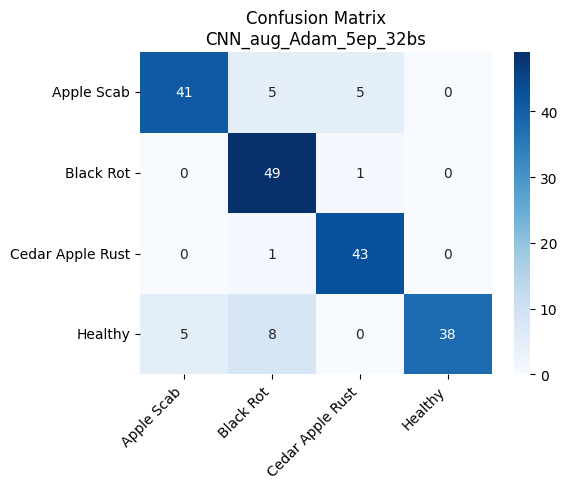


CNN_aug_Adam_5ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.946     0.686     0.795        51
       Black Rot      0.731     0.980     0.838        50
Cedar Apple Rust      0.953     0.932     0.943        44
         Healthy      0.878     0.843     0.860        51

        accuracy                          0.857       196
       macro avg      0.877     0.860     0.859       196
    weighted avg      0.875     0.857     0.856       196



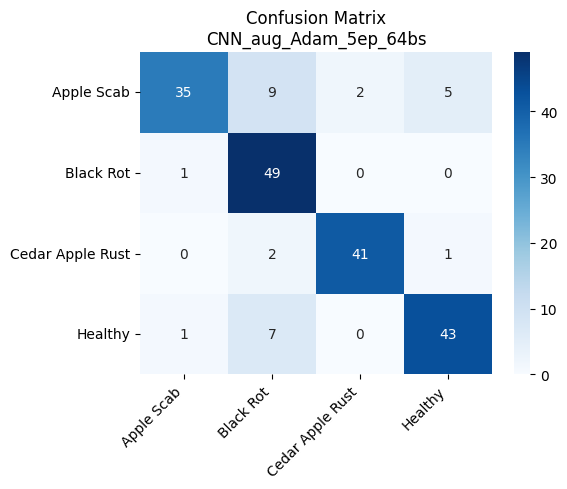


CNN_aug_Adam_5ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 93ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.864     0.745     0.800        51
       Black Rot      0.710     0.980     0.824        50
Cedar Apple Rust      0.854     0.932     0.891        44
         Healthy      0.971     0.667     0.791        51

        accuracy                          0.827       196
       macro avg      0.850     0.831     0.826       196
    weighted avg      0.850     0.827     0.824       196



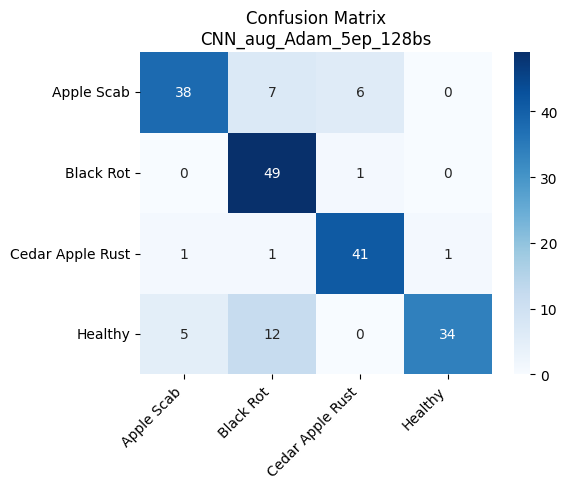


CNN_aug_Adam_10ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.936     0.863     0.898        51
       Black Rot      0.893     1.000     0.943        50
Cedar Apple Rust      0.933     0.955     0.944        44
         Healthy      0.938     0.882     0.909        51

        accuracy                          0.923       196
       macro avg      0.925     0.925     0.924       196
    weighted avg      0.925     0.923     0.923       196



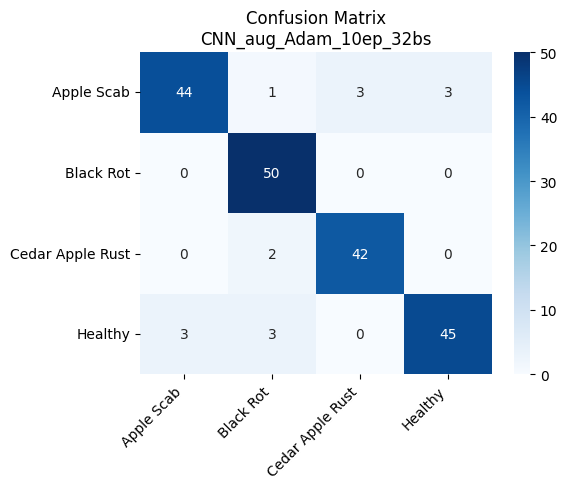


CNN_aug_Adam_10ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 83ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.930     0.784     0.851        51
       Black Rot      0.746     1.000     0.855        50
Cedar Apple Rust      1.000     0.977     0.989        44
         Healthy      0.907     0.765     0.830        51

        accuracy                          0.878       196
       macro avg      0.896     0.882     0.881       196
    weighted avg      0.893     0.878     0.877       196



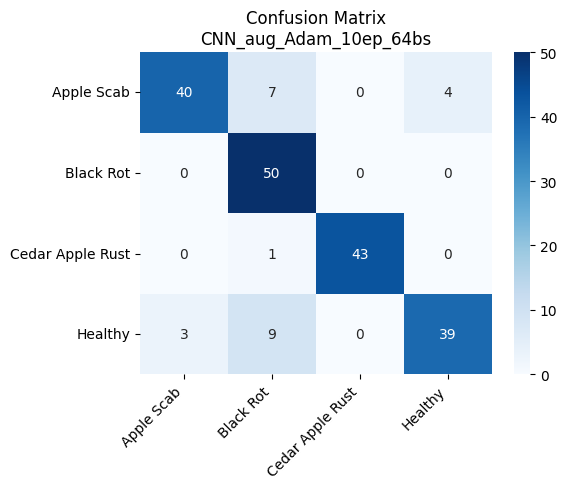


CNN_aug_Adam_10ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.673     0.647     0.660        51
       Black Rot      0.562     1.000     0.719        50
Cedar Apple Rust      1.000     0.523     0.687        44
         Healthy      0.943     0.647     0.767        51

        accuracy                          0.709       196
       macro avg      0.795     0.704     0.708       196
    weighted avg      0.788     0.709     0.709       196



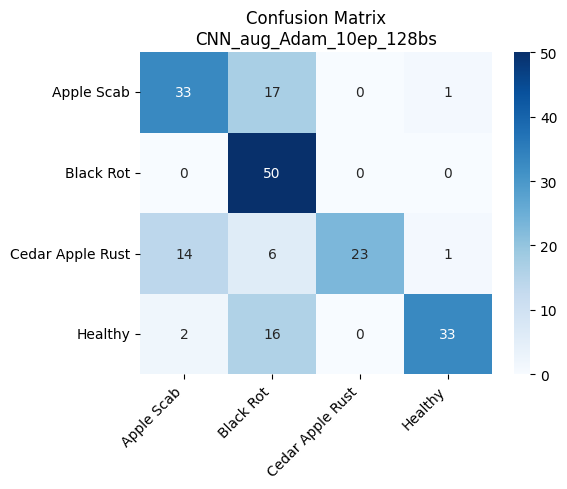


CNN_aug_Adam_20ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.941     0.970        51
       Black Rot      0.962     1.000     0.980        50
Cedar Apple Rust      1.000     1.000     1.000        44
         Healthy      0.981     1.000     0.990        51

        accuracy                          0.985       196
       macro avg      0.986     0.985     0.985       196
    weighted avg      0.985     0.985     0.985       196



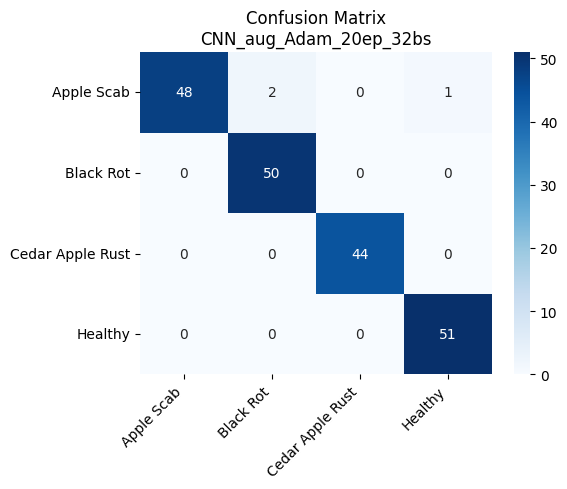


CNN_aug_Adam_20ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 82ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.725     0.841        51
       Black Rot      0.980     1.000     0.990        50
Cedar Apple Rust      1.000     0.977     0.989        44
         Healthy      0.785     1.000     0.879        51

        accuracy                          0.923       196
       macro avg      0.941     0.926     0.925       196
    weighted avg      0.939     0.923     0.922       196



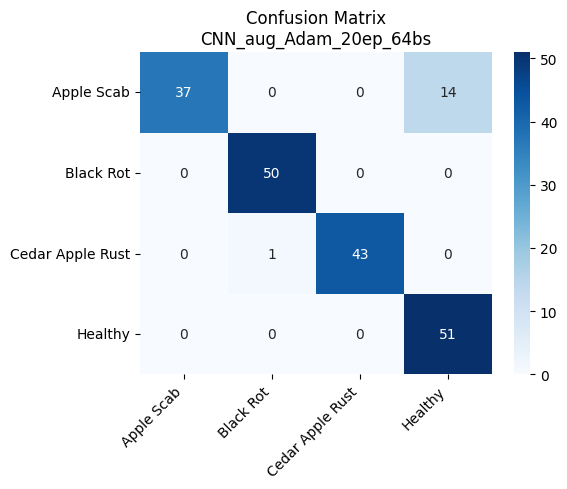


CNN_aug_Adam_20ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.970     0.627     0.762        51
       Black Rot      0.923     0.960     0.941        50
Cedar Apple Rust      0.974     0.841     0.902        44
         Healthy      0.699     1.000     0.823        51

        accuracy                          0.857       196
       macro avg      0.891     0.857     0.857       196
    weighted avg      0.888     0.857     0.855       196



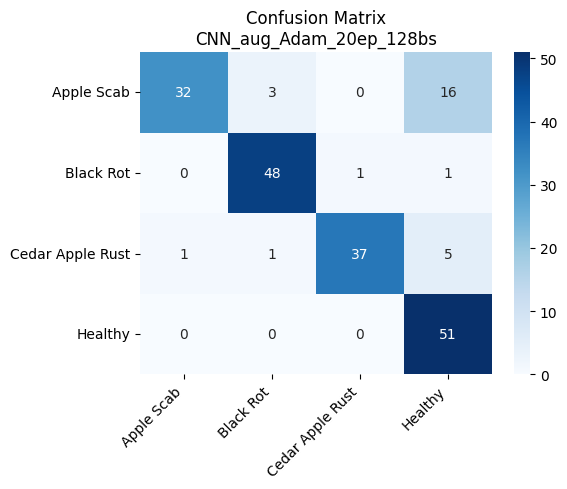


CNN_aug_SGD_5ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.843     0.915        51
       Black Rot      0.942     0.980     0.961        50
Cedar Apple Rust      0.977     0.977     0.977        44
         Healthy      0.895     1.000     0.944        51

        accuracy                          0.949       196
       macro avg      0.954     0.950     0.949       196
    weighted avg      0.953     0.949     0.948       196



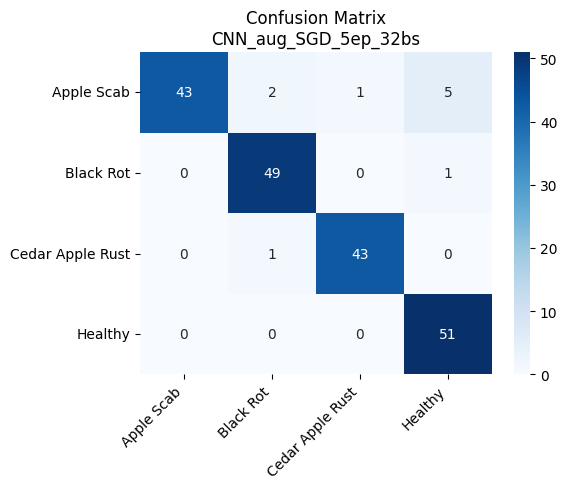


CNN_aug_SGD_5ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.844     0.745     0.792        51
       Black Rot      0.894     0.840     0.866        50
Cedar Apple Rust      0.826     0.864     0.844        44
         Healthy      0.793     0.902     0.844        51

        accuracy                          0.837       196
       macro avg      0.839     0.838     0.837       196
    weighted avg      0.840     0.837     0.836       196



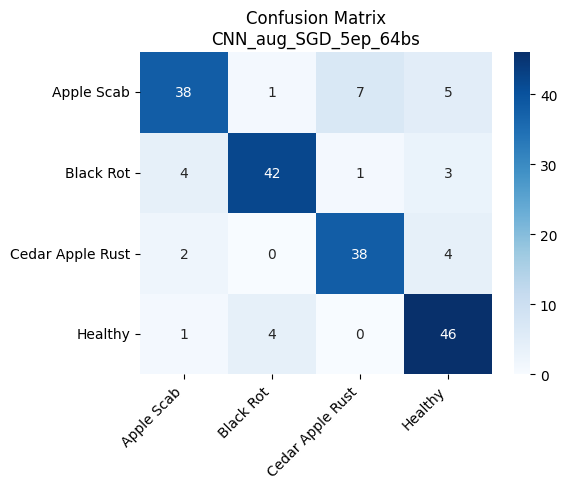


CNN_aug_SGD_5ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.524     0.431     0.473        51
       Black Rot      0.674     0.580     0.624        50
Cedar Apple Rust      0.875     0.318     0.467        44
         Healthy      0.442     0.824     0.575        51

        accuracy                          0.546       196
       macro avg      0.629     0.538     0.535       196
    weighted avg      0.620     0.546     0.537       196



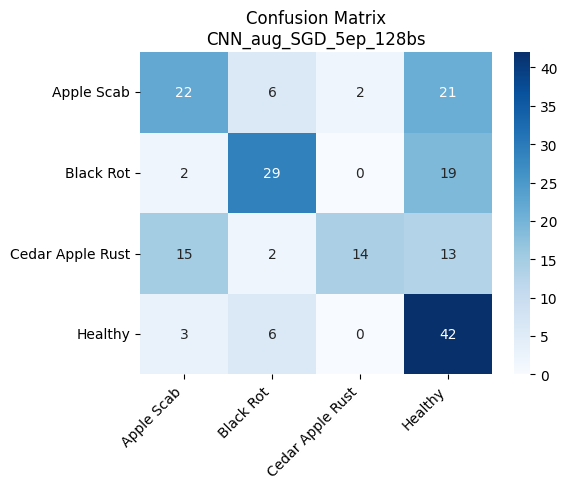


CNN_aug_SGD_10ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 88ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.608     0.756        51
       Black Rot      0.926     1.000     0.962        50
Cedar Apple Rust      0.917     1.000     0.957        44
         Healthy      0.778     0.961     0.860        51

        accuracy                          0.888       196
       macro avg      0.905     0.892     0.883       196
    weighted avg      0.905     0.888     0.880       196



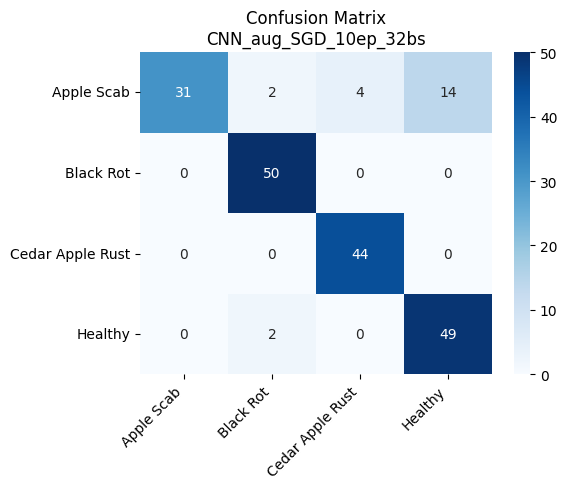


CNN_aug_SGD_10ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.978     0.882     0.928        51
       Black Rot      0.926     1.000     0.962        50
Cedar Apple Rust      0.956     0.977     0.966        44
         Healthy      0.961     0.961     0.961        51

        accuracy                          0.954       196
       macro avg      0.955     0.955     0.954       196
    weighted avg      0.955     0.954     0.954       196



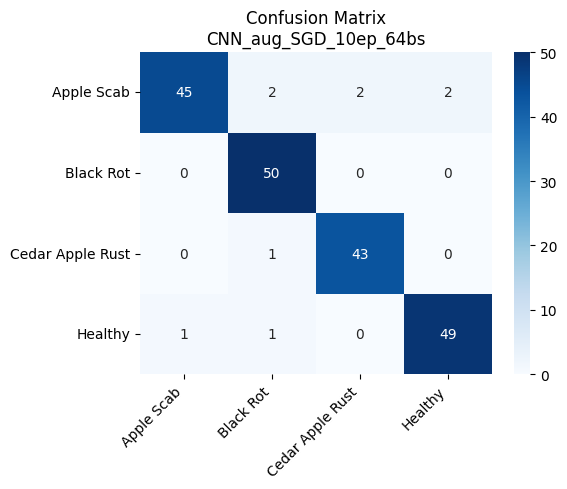


CNN_aug_SGD_10ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.882     0.588     0.706        51
       Black Rot      0.735     1.000     0.847        50
Cedar Apple Rust      0.724     0.955     0.824        44
         Healthy      1.000     0.706     0.828        51

        accuracy                          0.806       196
       macro avg      0.835     0.812     0.801       196
    weighted avg      0.840     0.806     0.800       196



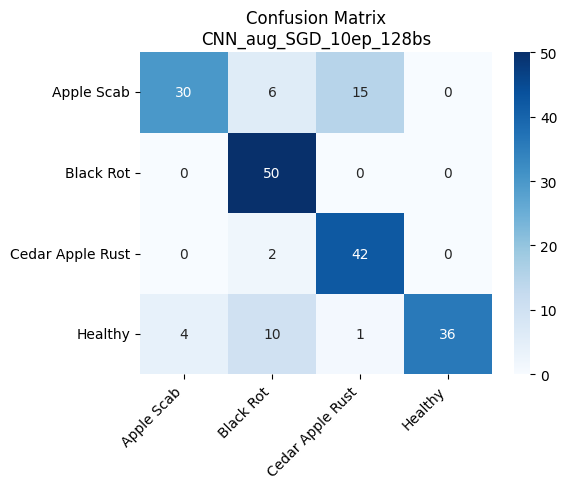


CNN_aug_SGD_20ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 91ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.944     1.000     0.971        51
       Black Rot      0.980     1.000     0.990        50
Cedar Apple Rust      1.000     0.977     0.989        44
         Healthy      1.000     0.941     0.970        51

        accuracy                          0.980       196
       macro avg      0.981     0.980     0.980       196
    weighted avg      0.981     0.980     0.980       196



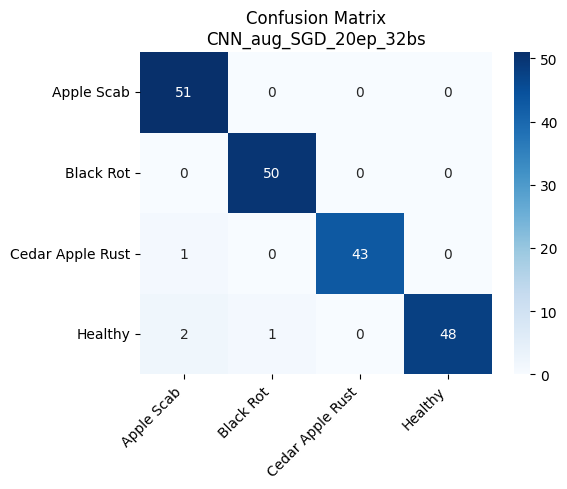


CNN_aug_SGD_20ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.961     0.980        51
       Black Rot      1.000     1.000     1.000        50
Cedar Apple Rust      0.978     1.000     0.989        44
         Healthy      0.981     1.000     0.990        51

        accuracy                          0.990       196
       macro avg      0.990     0.990     0.990       196
    weighted avg      0.990     0.990     0.990       196



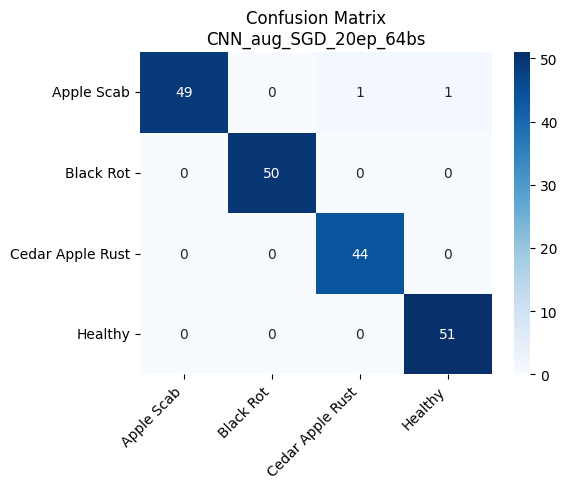


CNN_aug_SGD_20ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.920     0.451     0.605        51
       Black Rot      0.681     0.980     0.803        50
Cedar Apple Rust      0.784     0.909     0.842        44
         Healthy      0.833     0.784     0.808        51

        accuracy                          0.776       196
       macro avg      0.805     0.781     0.765       196
    weighted avg      0.806     0.776     0.762       196



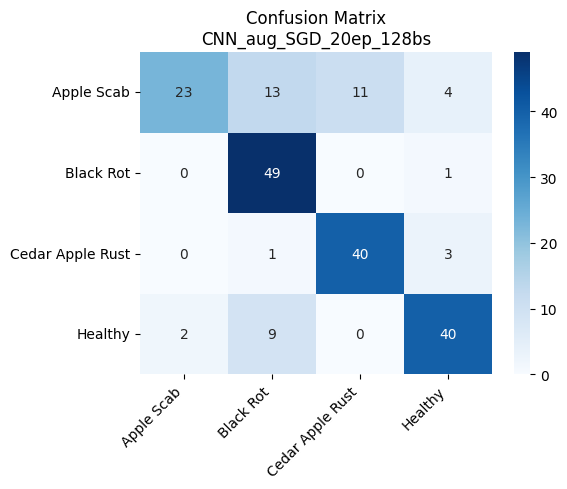


CNN_aug_RMSprop_5ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.914     0.627     0.744        51
       Black Rot      0.780     0.920     0.844        50
Cedar Apple Rust      0.872     0.932     0.901        44
         Healthy      0.836     0.902     0.868        51

        accuracy                          0.842       196
       macro avg      0.851     0.845     0.839       196
    weighted avg      0.850     0.842     0.837       196



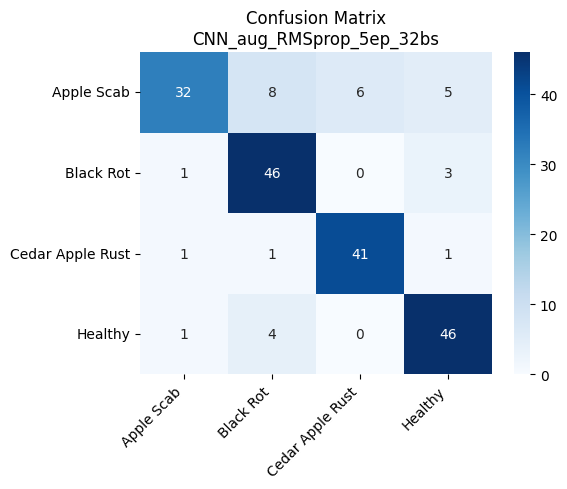


CNN_aug_RMSprop_5ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.884     0.745     0.809        51
       Black Rot      0.774     0.960     0.857        50
Cedar Apple Rust      0.857     0.955     0.903        44
         Healthy      0.952     0.784     0.860        51

        accuracy                          0.857       196
       macro avg      0.867     0.861     0.857       196
    weighted avg      0.868     0.857     0.856       196



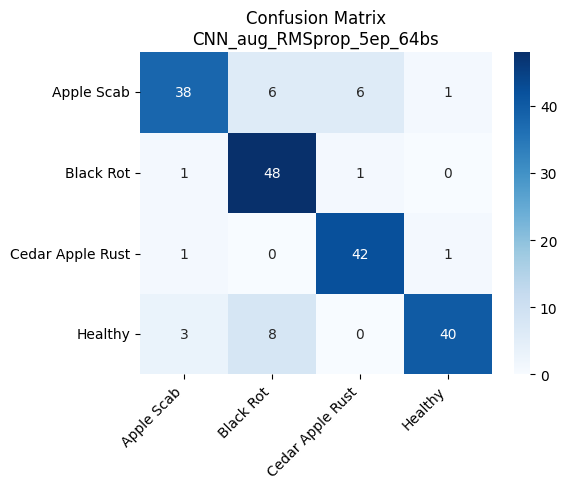


CNN_aug_RMSprop_5ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.900     0.529     0.667        51
       Black Rot      0.533     0.980     0.690        50
Cedar Apple Rust      0.857     0.818     0.837        44
         Healthy      0.969     0.608     0.747        51

        accuracy                          0.730       196
       macro avg      0.815     0.734     0.735       196
    weighted avg      0.815     0.730     0.732       196



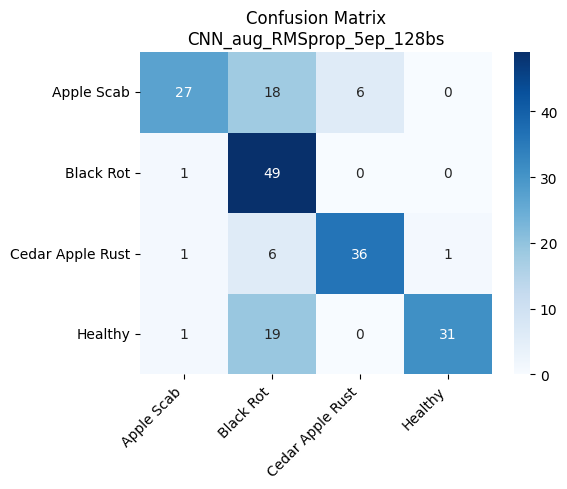


CNN_aug_RMSprop_10ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 84ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.784     0.879        51
       Black Rot      0.877     1.000     0.935        50
Cedar Apple Rust      1.000     0.977     0.989        44
         Healthy      0.821     0.902     0.860        51

        accuracy                          0.913       196
       macro avg      0.925     0.916     0.916       196
    weighted avg      0.922     0.913     0.913       196



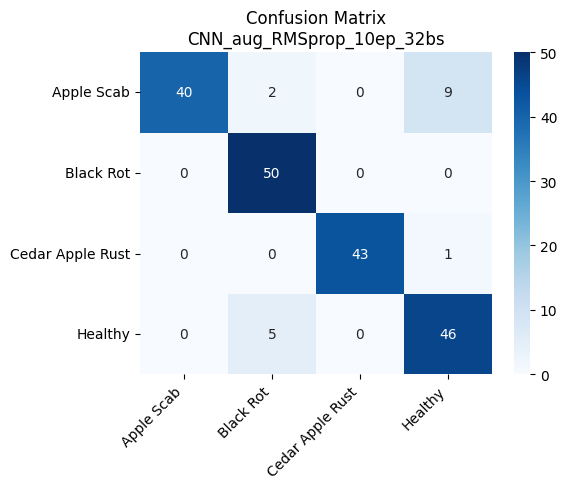


CNN_aug_RMSprop_10ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 92ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.953     0.804     0.872        51
       Black Rot      0.803     0.980     0.883        50
Cedar Apple Rust      0.933     0.955     0.944        44
         Healthy      0.915     0.843     0.878        51

        accuracy                          0.893       196
       macro avg      0.901     0.895     0.894       196
    weighted avg      0.901     0.893     0.892       196



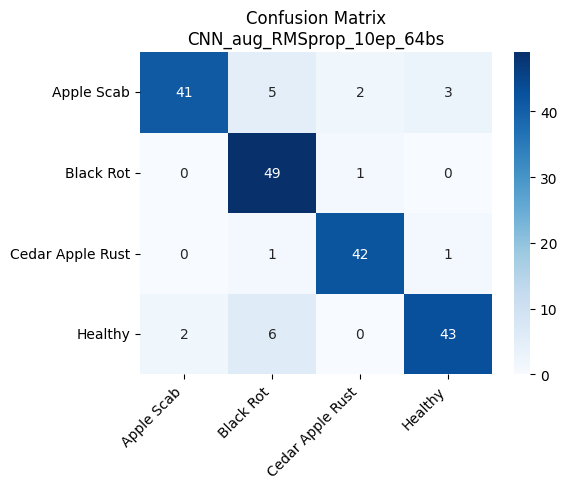


CNN_aug_RMSprop_10ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 86ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.905     0.373     0.528        51
       Black Rot      0.549     1.000     0.709        50
Cedar Apple Rust      0.698     1.000     0.822        44
         Healthy      1.000     0.412     0.583        51

        accuracy                          0.684       196
       macro avg      0.788     0.696     0.661       196
    weighted avg      0.793     0.684     0.655       196



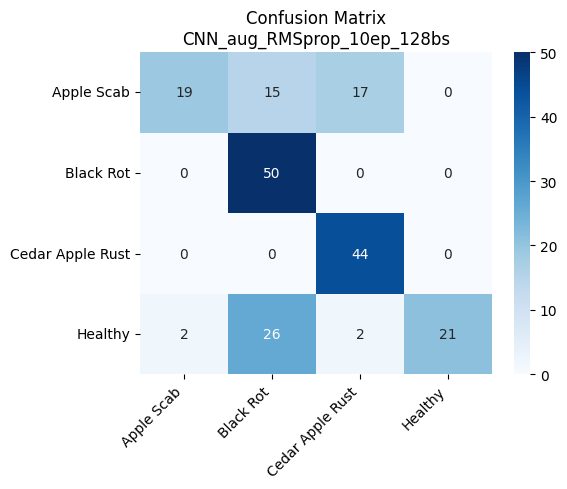


CNN_aug_RMSprop_20ep_32bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 87ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.955     0.412     0.575        51
       Black Rot      0.847     1.000     0.917        50
Cedar Apple Rust      0.800     1.000     0.889        44
         Healthy      0.800     0.941     0.865        51

        accuracy                          0.832       196
       macro avg      0.851     0.838     0.812       196
    weighted avg      0.852     0.832     0.808       196



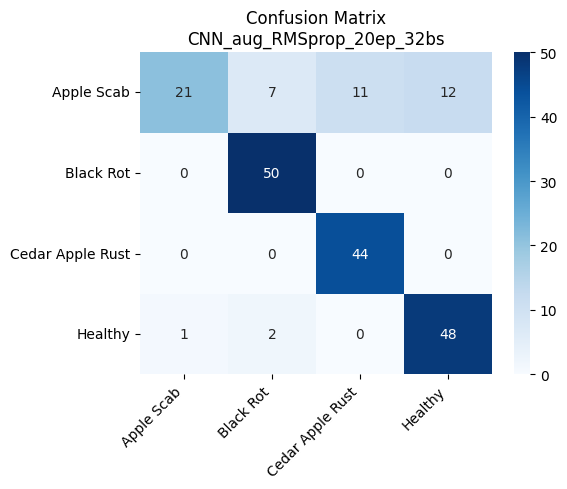


CNN_aug_RMSprop_20ep_64bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 89ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      1.000     0.882     0.938        51
       Black Rot      0.943     1.000     0.971        50
Cedar Apple Rust      0.978     1.000     0.989        44
         Healthy      0.943     0.980     0.962        51

        accuracy                          0.964       196
       macro avg      0.966     0.966     0.965       196
    weighted avg      0.966     0.964     0.964       196



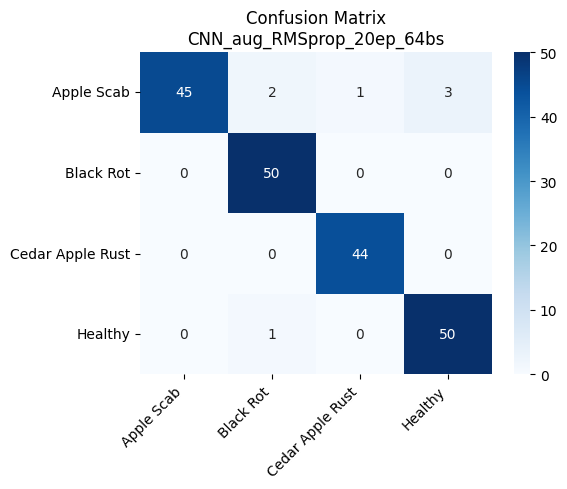


CNN_aug_RMSprop_20ep_128bs
7/7 ━━━━━━━━━━━━━━━━━━━━ 1s 85ms/step

Classification Report:
                  precision    recall  f1-score   support

      Apple Scab      0.956     0.843     0.896        51
       Black Rot      0.725     1.000     0.840        50
Cedar Apple Rust      1.000     0.795     0.886        44
         Healthy      0.915     0.843     0.878        51

        accuracy                          0.872       196
       macro avg      0.899     0.870     0.875       196
    weighted avg      0.896     0.872     0.875       196



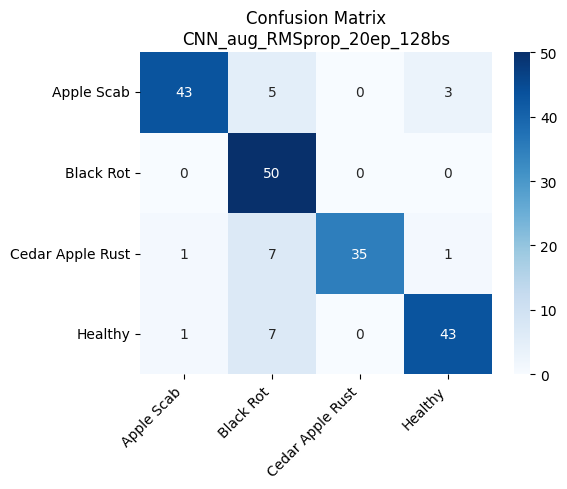

In [43]:
evaluate_cnn_models(cnn_augmented)


Accuracy Curves


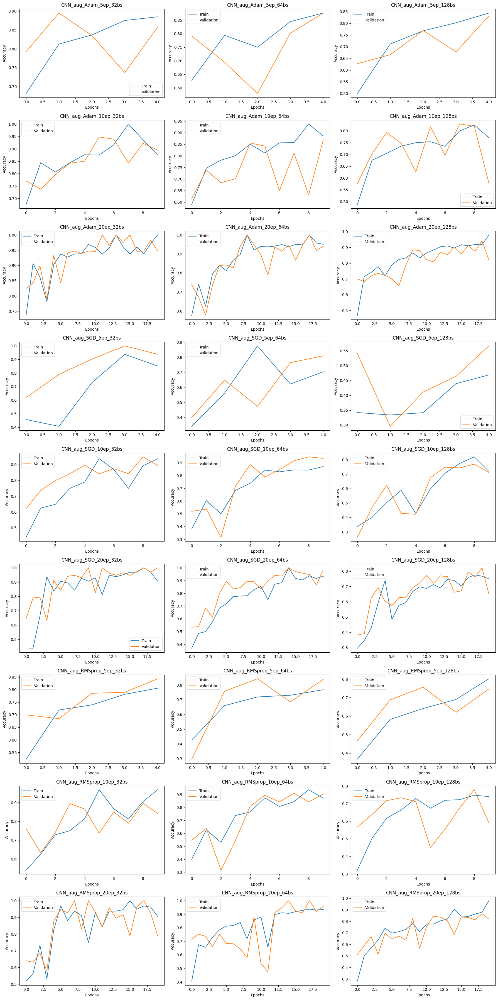


Loss Curves


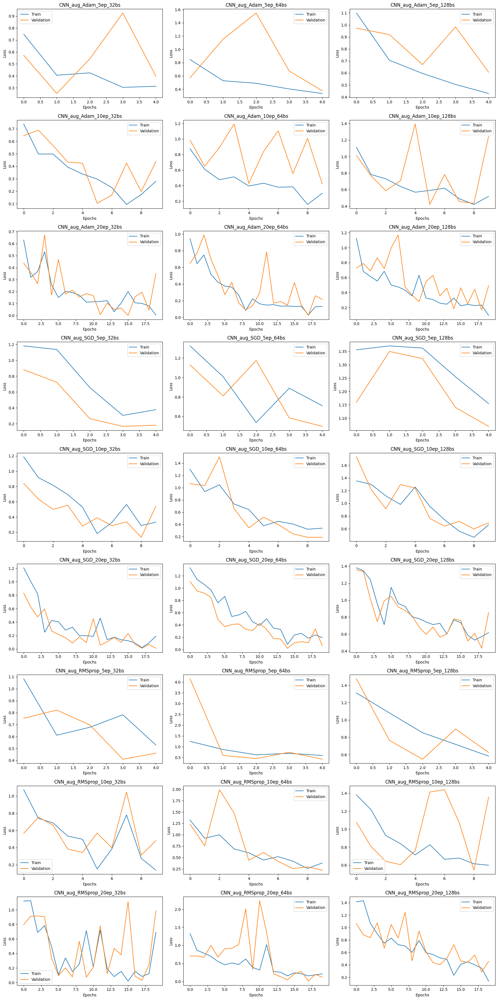

In [44]:
print("\nAccuracy Curves")
plot_metrics(cnn_augmented, metric='accuracy')

print("\nLoss Curves")
plot_metrics(cnn_augmented, metric='loss')

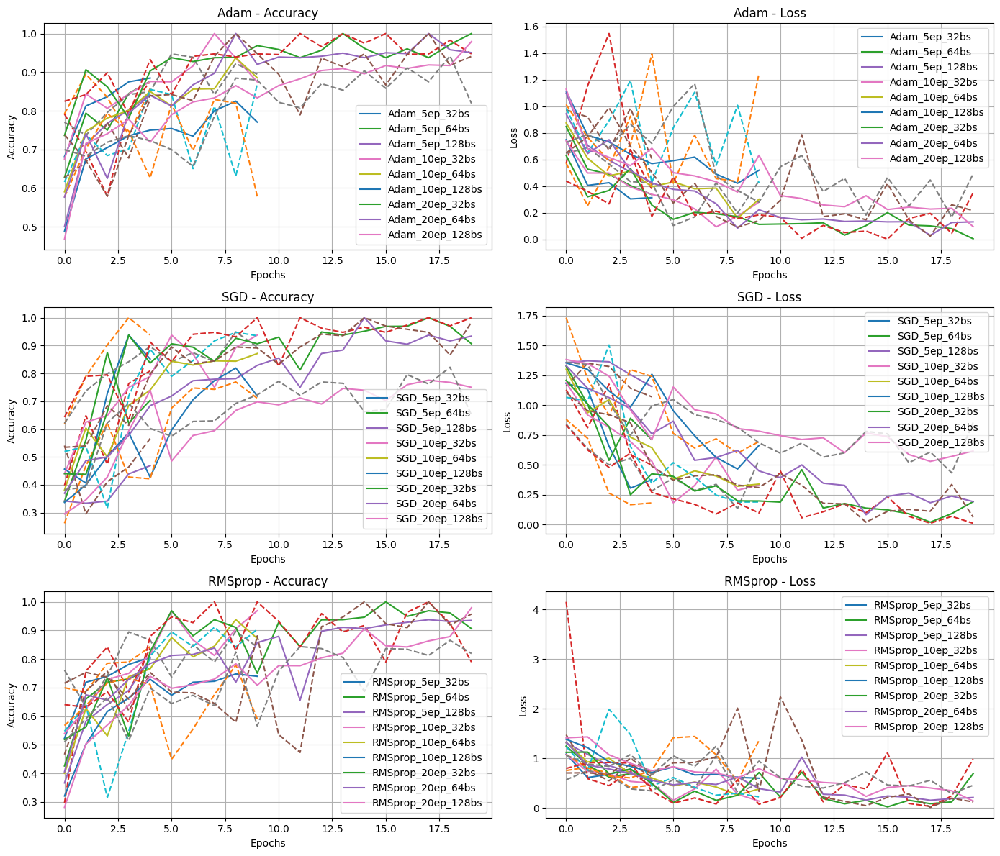

In [47]:
fig, axs = plt.subplots(3, 2, figsize=(14, 12))
optimizer_names = ['Adam', 'SGD', 'RMSprop']

for i, opt_name in enumerate(optimizer_names):
    ax_acc = axs[i][0]
    ax_loss = axs[i][1]
    ax_acc.set_title(f'{opt_name} - Accuracy')
    ax_loss.set_title(f'{opt_name} - Loss')

    for key in cnn_augmented:
        if f"CNN_aug_{opt_name}" in key:
            history = cnn_augmented[key]['history']
            label = key.split('_', 2)[-1]
            ax_acc.plot(history['accuracy'], label=label)
            ax_acc.plot(history['val_accuracy'], linestyle='--')
            ax_loss.plot(history['loss'], label=label)
            ax_loss.plot(history['val_loss'], linestyle='--')

    ax_acc.set_ylabel('Accuracy')
    ax_loss.set_ylabel('Loss')
    ax_acc.set_xlabel('Epochs')
    ax_loss.set_xlabel('Epochs')
    ax_acc.grid(True)
    ax_loss.grid(True)
    ax_acc.legend()
    ax_loss.legend()

plt.tight_layout()
plt.show()

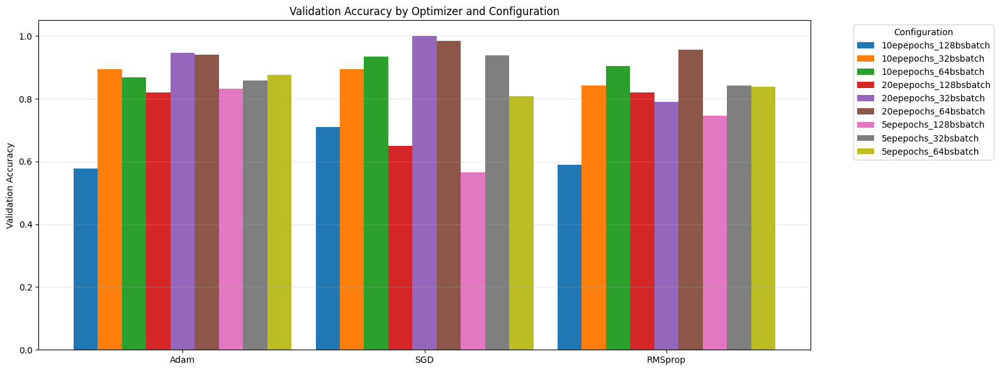

In [50]:
import numpy as np
import matplotlib.pyplot as plt

# Prepare bar chart data
bar_data = {}
for key in cnn_augmented:
    parts = key.split('_')
    opt_name = parts[2]  # Changed index since key format is "CNN_aug_Adam_5ep_32bs"
    config_label = f"{parts[3]}epochs_{parts[4]}batch"
    val_acc = cnn_augmented[key]['history']['val_accuracy'][-1]

    if opt_name not in bar_data:
        bar_data[opt_name] = {}
    bar_data[opt_name][config_label] = val_acc

optimizers = list(bar_data.keys())
configs = sorted(list({cfg for opt in bar_data.values() for cfg in opt.keys()}))

# Plotting
plt.figure(figsize=(16, 6))
x = np.arange(len(optimizers))
width = 0.10 # Adjusted width for better spacing

for i, cfg in enumerate(configs):
    plt.bar(x + i * width, [bar_data[opt].get(cfg, 0) for opt in optimizers],
            width=width, label=cfg)

plt.ylabel('Validation Accuracy')
plt.title('Validation Accuracy by Optimizer and Configuration')
plt.xticks(x + width * (len(configs)-1)/2, optimizers)
plt.legend(title='Configuration', bbox_to_anchor=(1.05, 1))
plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

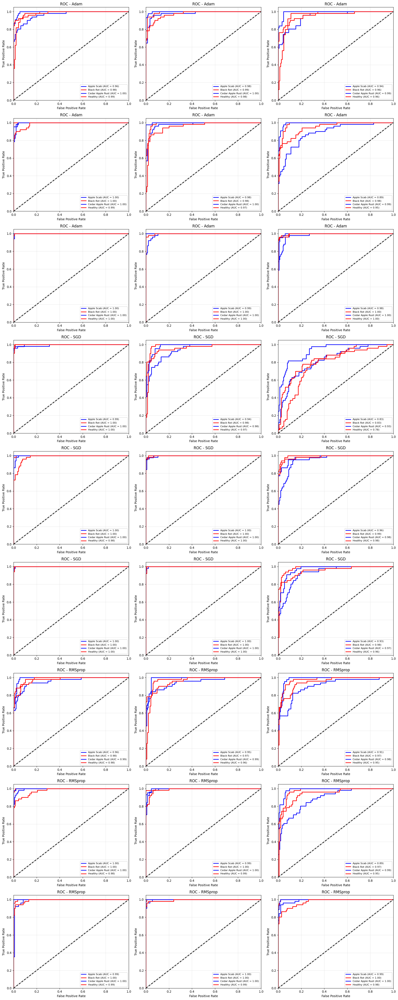

In [51]:
from math import ceil
from itertools import cycle
from sklearn.metrics import roc_curve, auc

num_models = len(cnn_augmented)
cols = 3
rows = ceil(num_models / cols)

fig, axes = plt.subplots(rows, cols, figsize=(6 * cols, 5 * rows))
if num_models == 1:
    axes = np.array([axes])  # Ensure axes is always array-like
axes = axes.ravel()

# Generate ROC curve for each model in separate subplot
for i, (model_name, model_data) in enumerate(cnn_augmented.items()):
    model = model_data['model']
    
    # Get true labels and predictions
    test_generator.reset()
    y_true = []
    y_pred = []
    
    for _ in range(ceil(test_generator.samples / test_generator.batch_size)):
        x, y = next(test_generator)
        y_true.extend(y)
        y_pred.extend(model.predict(x, verbose=0))
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Compute ROC curve and ROC area for each class
    ax = axes[i]
    colors = cycle(['blue', 'red'])
    
    for j, color in zip(range(y_true.shape[1]), colors):
        fpr, tpr, _ = roc_curve(y_true[:, j], y_pred[:, j])
        roc_auc = auc(fpr, tpr)
        ax.plot(fpr, tpr, color=color, lw=2,
                label=f'{class_names[j]} (AUC = {roc_auc:.2f})')
    
    ax.plot([0, 1], [0, 1], 'k--', lw=2)
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(f'ROC - {model_name.split("_")[2]}')  # Cleaner title
    ax.legend(loc="lower right", fontsize=8)
    ax.grid(True, alpha=0.3)

# Hide empty subplots if any
for j in range(i+1, len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

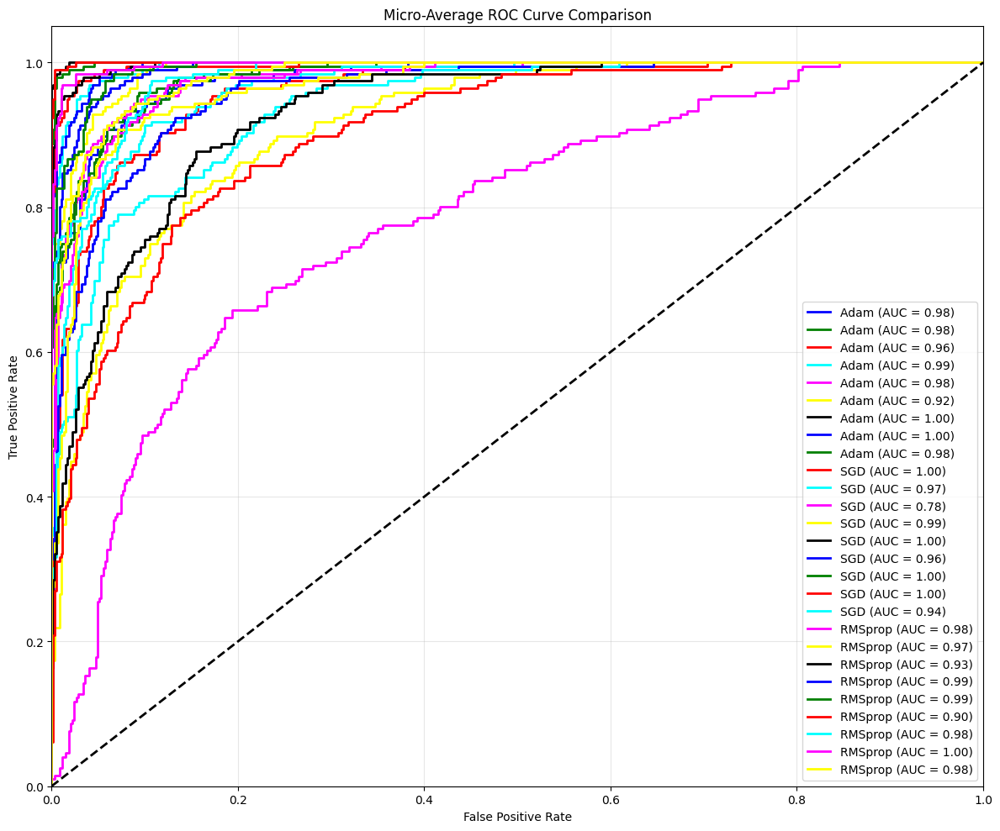

In [52]:
plt.figure(figsize=(12, 10))
colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black'])
lw = 2

for model_name, model_data in cnn_augmented.items():
    model = model_data['model']
    
    test_generator.reset()
    y_true = []
    y_pred = []
    
    for _ in range(ceil(test_generator.samples / test_generator.batch_size)):
        x, y = next(test_generator)
        y_true.extend(y)
        y_pred.extend(model.predict(x, verbose=0))
    
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # Micro-average ROC curve
    fpr, tpr, _ = roc_curve(y_true.ravel(), y_pred.ravel())
    roc_auc = auc(fpr, tpr)
    
    color = next(colors)
    plt.plot(fpr, tpr, color=color, lw=lw,
             label=f'{model_name.split("_")[2]} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=lw)
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Micro-Average ROC Curve Comparison')
plt.legend(loc="lower right", fontsize=10)
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step 
7/7 ━━━━━━━━

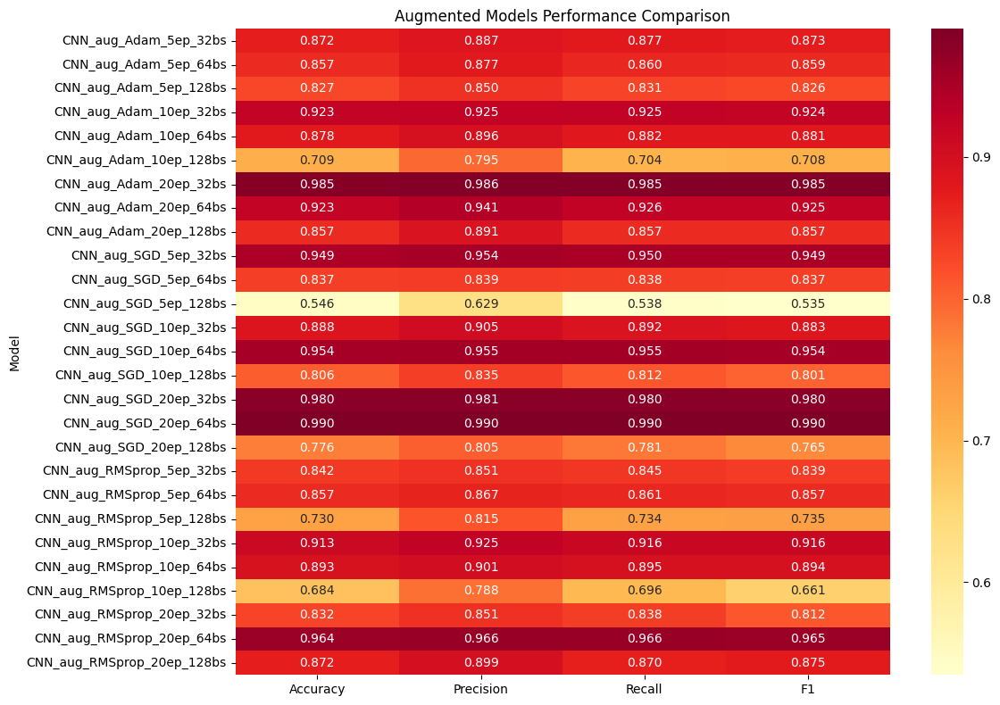


Saved best augmented model: CNN_aug_SGD_20ep_64bs with accuracy 0.9898


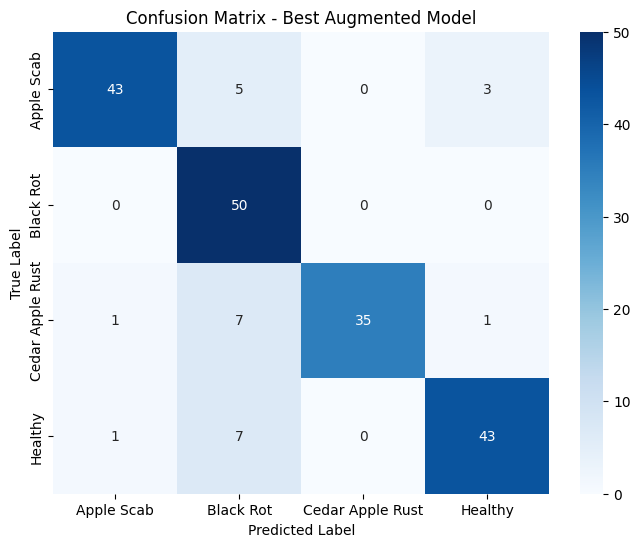

In [60]:
# Reset and prepare test data
test_generator.reset()
test_images, test_labels = [], []
for i in range(len(test_generator)):
    img_batch, label_batch = test_generator[i]
    test_images.append(img_batch)
    test_labels.append(label_batch)

test_images = np.concatenate(test_images)
test_labels = np.concatenate(test_labels)

# Initialize metrics storage
metrics_data_aug = []
best_model_aug = None
best_score_aug = 0

# Evaluate each augmented model
for key, model_data in cnn_augmented.items():
    model = model_data['model']
    y_pred = model.predict(test_images)
    y_pred_classes = np.argmax(y_pred, axis=1)
    y_true = np.argmax(test_labels, axis=1)
    
    # Calculate metrics
    acc = np.mean(y_pred_classes == y_true)
    report = classification_report(
        y_true, y_pred_classes, 
        target_names=class_names,
        output_dict=True
    )
    
    metrics_data_aug.append({
        'Model': key,
        'Accuracy': acc,
        'Precision': report['macro avg']['precision'],
        'Recall': report['macro avg']['recall'],
        'F1': report['macro avg']['f1-score']
    })
    
    # Track best model
    if acc > best_score_aug:
        best_score_aug = acc
        best_model_aug = model
        best_model_aug_name = key

# Create and display metrics DataFrame
metrics_df_aug = pd.DataFrame(metrics_data_aug).set_index('Model')
print("\nPerformance Metrics (Augmented Models):")
print(metrics_df_aug)

# Plot heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(metrics_df_aug, annot=True, fmt=".3f", cmap="YlOrRd")
plt.title("Augmented Models Performance Comparison")
plt.tight_layout()
plt.show()

# Save the best augmented model
if best_model_aug:
    best_model_aug.save('best_apple_augmented_model.h5')
    print(f"\nSaved best augmented model: {best_model_aug_name} with accuracy {best_score_aug:.4f}")
    
    # Confusion matrix for best augmented model
    cm_aug = confusion_matrix(y_true, y_pred_classes)
    plt.figure(figsize=(8, 6))
    sns.heatmap(
        cm_aug, 
        annot=True, 
        fmt='d', 
        cmap='Blues',
        xticklabels=class_names,
        yticklabels=class_names
    )
    plt.title('Confusion Matrix - Best Augmented Model')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


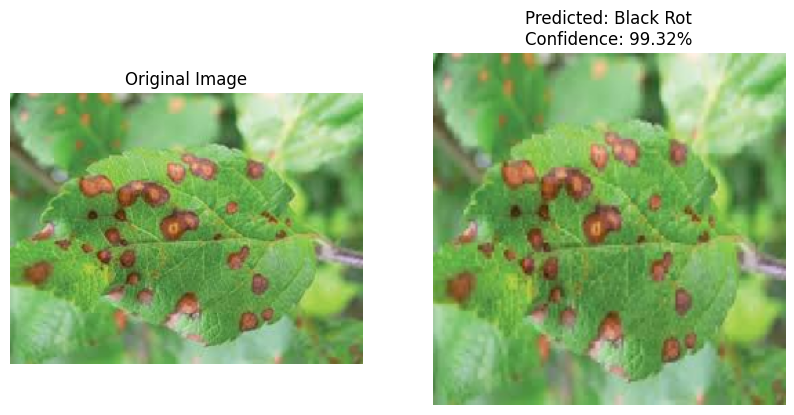

Predicted class: Black Rot, Confidence: 99.32%


In [71]:
from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def predict_and_display_aug(image_path):
    # Load and preprocess the image
    img = image.load_img(image_path, target_size=(150, 150))
    img_array = image.img_to_array(img) / 255.0  # Normalize to [0,1]
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    
    # Use the best augmented model (fallback to first model if none exists)
    model = best_model_aug if best_model_aug else list(cnn_augmented.values())[0]['model']
    pred = model.predict(img_array)
    class_idx = np.argmax(pred[0])
    confidence = np.max(pred[0])
    
    # Plot results
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(image.load_img(image_path))
    plt.title("Original Image")
    plt.axis('off')
    
    plt.subplot(1, 2, 2)
    plt.imshow(img)
    plt.title(f"Predicted: {class_names[class_idx]}\nConfidence: {confidence:.2%}")
    plt.axis('off')
    
    plt.show()
    return class_names[class_idx], confidence

# Example usage
predicted_class, confidence = predict_and_display_aug("/kaggle/input/black-rot/ass-3-apple-black-rotjpeg.jpeg")
print(f"Predicted class: {predicted_class}, Confidence: {confidence:.2%}")


## Conclusion:

In this experiment on the PlantVillage Apple dataset, CNN models were evaluated with and without data augmentation using Adam, RMSprop, and SGD optimizers.

CNN models with data augmentation and SGD optimizer performed best, with 20 epochs and 64batch size achieving 99.0% across all metrics. Among non-augmented models, CNN with Adam (20 epochs, batch size 32) showed strong performance at 98.6% accuracy.

RMSprop delivered moderate results overall, while models with fewer epochs or larger batch sizes generally underperformed.

Overall, CNN + SGD with augmentation proved to be the most effective setup, closely followed by CNN + Adam without augmentation.
